<a href="https://colab.research.google.com/github/gilatsmoni96/DS-projects/blob/main/Exercice_1_EDA_and_Data_Cleansing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Gil Atsmoni

ID: 316354166

mail_address: gilats96@gmail.com

In this assignment we will perform EDA and variable cleansing on the data file hrm-employee-attrition_unclean.csv. The purpose of the assignment is to practice the material learned in the past few lessons, so that we can apply the tools we learned in the future.

In [ ]:
!pip install sweetviz

In [ ]:
import pandas as pd

# URL של הדף ב-Google Sheets
url = 'https://docs.google.com/spreadsheets/d/1Cj8oeGwiKoUrT81xGR2A4AXZIt0z13eVzFoDJgL6ZVc/edit?usp=sharing'

# קריאת הדף ישירות ל-DataFrame
df = pd.read_csv(url.replace('/edit?usp=sharing', '/export?format=csv'))

In [ ]:
df.head()

,Unnamed: 0,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,SalaryAddition,YearlyHollidayDays,DrivingKilometers
0,0,Yes,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,...,8,0.0,1,6,4,NaN,5,792.803050,10.0,NaN
1,1,No,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,...,10,3.0,3,10,7,1.0,7,1199.848653,NaN,NaN
2,2,Yes,37,Travel_Rarely,1373,Research & Development,2,2,Other,4,...,7,3.0,3,0,0,0.0,0,1366.620630,NaN,NaN
3,3,No,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,...,8,3.0,3,8,7,3.0,0,1770.840125,10.0,0.640162
4,4,No,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,...,6,3.0,3,2,2,2.0,2,1043.414893,10.0,2.122465


####1. Using SweetViz to make the initial EDA.


In [ ]:
import sweetviz as sv

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

sweet_report = sv.analyze(df)

# ציין את הנתיב בו תרצה לשמור
save_path = '/content/drive/MyDrive/sweet_report.html'

# שמור את הדוח
sweet_report.show_html(save_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


                                             |          | [  0%]   00:00 -> (? left)

Report /content/drive/MyDrive/sweet_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



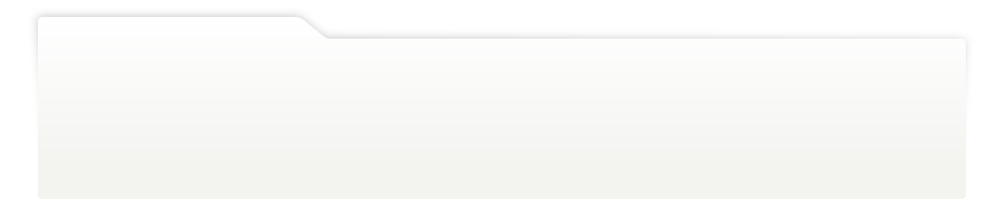
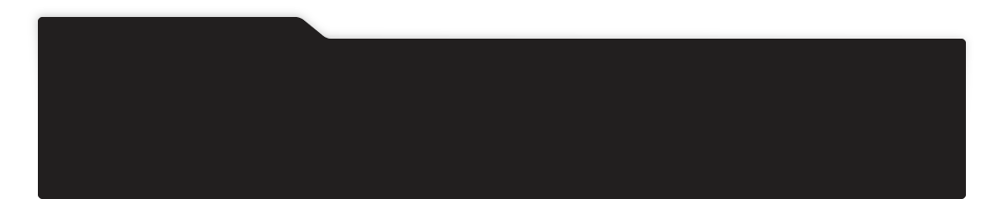
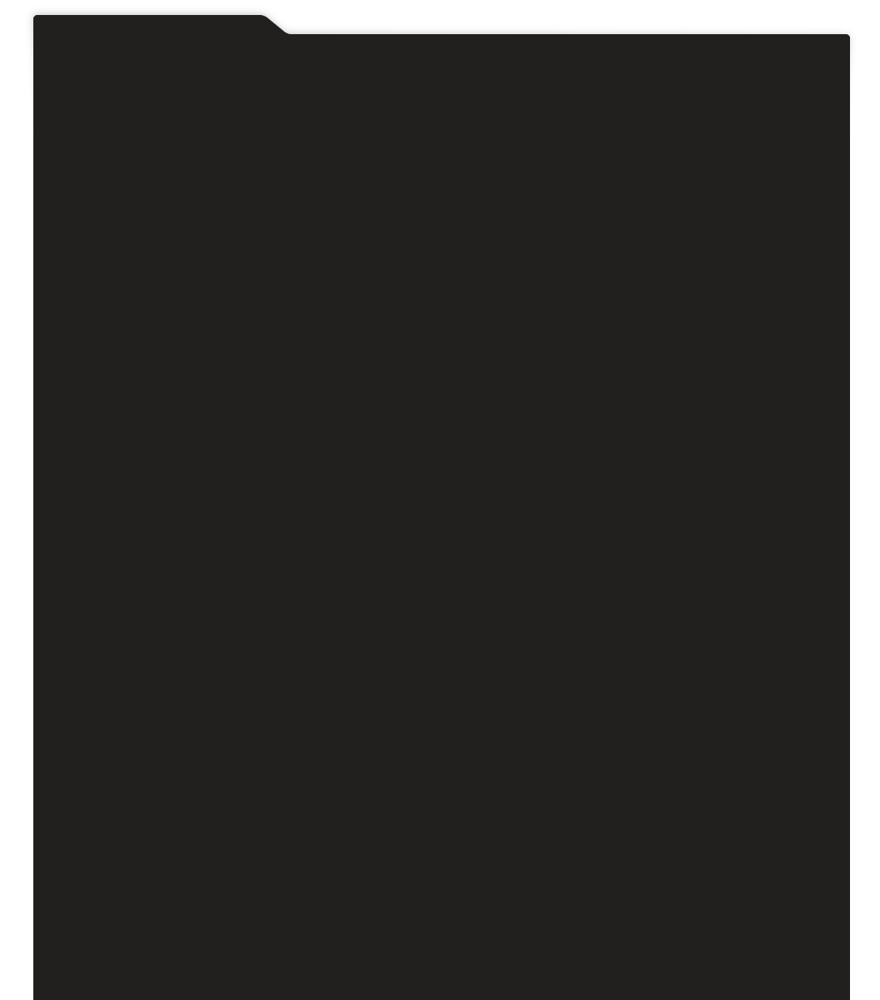
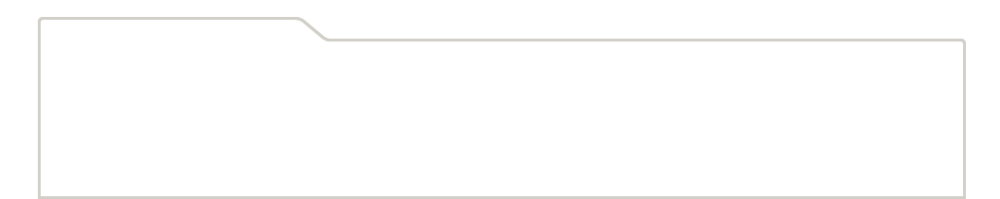
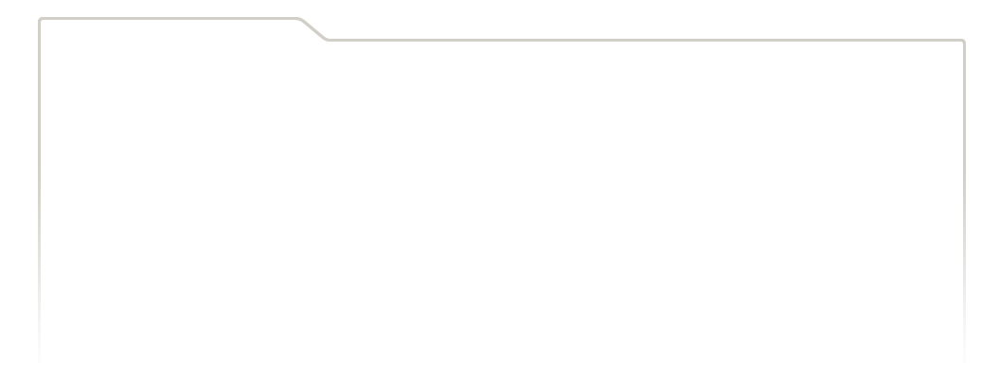
...
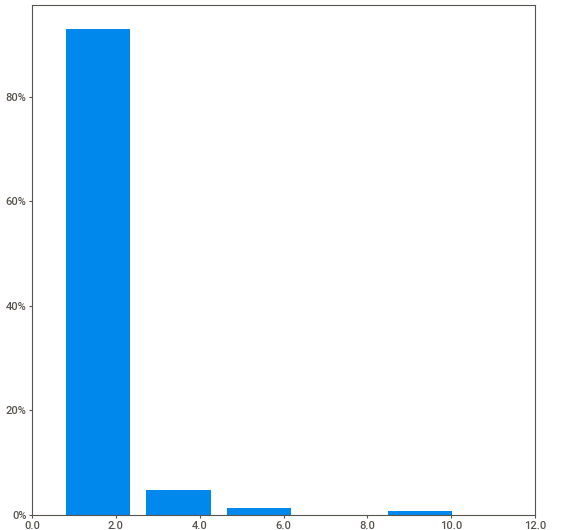
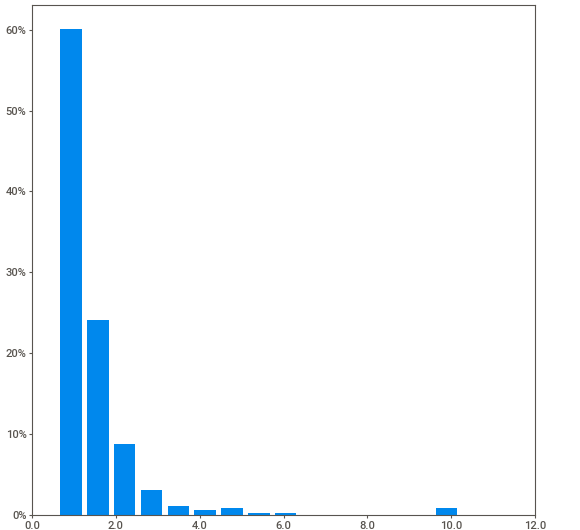
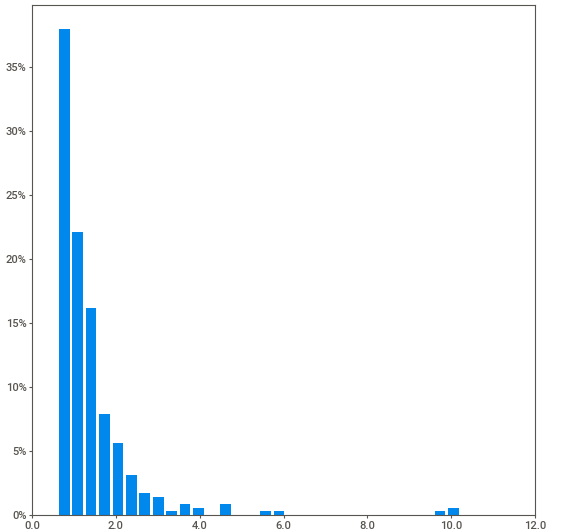
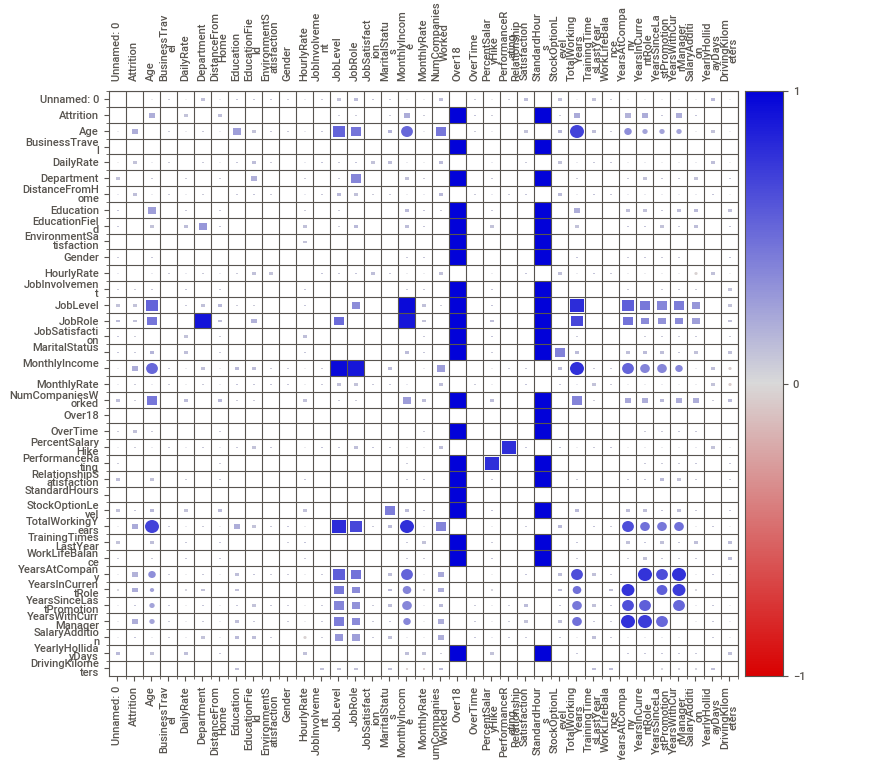
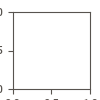

In [ ]:
sweet_report.show_notebook()

####2. Checking each variable using graphs, and grouping them by data types (categorical-nominal, ordinal, and continuous).

First, I will check the shape of the data and the data types in order to change to the right type if needed.

In [ ]:
df.shape

(1470, 37)

In [ ]:
df.dtypes

Unnamed: 0                    int64
Attrition                    object
Age                           int64
BusinessTravel               object
DailyRate                     int64
Department                   object
DistanceFromHome              int64
Education                     int64
EducationField               object
EnvironmentSatisfaction       int64
Gender                       object
HourlyRate                    int64
JobInvolvement                int64
JobLevel                      int64
JobRole                      object
JobSatisfaction               int64
MaritalStatus                object
MonthlyIncome                 int64
MonthlyRate                   int64
NumCompaniesWorked          float64
Over18                       object
OverTime                     object
PercentSalaryHike             int64
PerformanceRating             int64
RelationshipSatisfaction      int64
StandardHours                 int64
StockOptionLevel              int64
TotalWorkingYears           

Changing the type of the variable from object to category.

In [ ]:
df['Attrition'] = df['Attrition'].astype('category')
df['BusinessTravel'] = df['BusinessTravel'].astype('category')
df['Department'] = df['Department'].astype('category')
df['EducationField'] = df['EducationField'].astype('category')
df['Gender'] = df['Gender'].astype('category')
df['JobRole'] = df['JobRole'].astype('category')
df['MaritalStatus'] = df['MaritalStatus'].astype('category')
df['Over18'] = df['Over18'].astype('category')
df['OverTime'] = df['OverTime'].astype('category')

Changing the type of the variable to ordinal by using a loop.

In [ ]:
import pandas as pd

columns_to_change = ['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction',
                   'PerformanceRating', 'RelationshipSatisfaction', 'WorkLifeBalance','StockOptionLevel']

for col in columns_to_change:
    df[col] = pd.Categorical(df[col], ordered=True)

print(df.dtypes)


Unnamed: 0                     int64
Attrition                   category
Age                            int64
BusinessTravel              category
DailyRate                      int64
Department                  category
DistanceFromHome               int64
Education                   category
EducationField              category
EnvironmentSatisfaction     category
Gender                      category
HourlyRate                     int64
JobInvolvement              category
JobLevel                    category
JobRole                     category
JobSatisfaction             category
MaritalStatus               category
MonthlyIncome                  int64
MonthlyRate                    int64
NumCompaniesWorked           float64
Over18                      category
OverTime                    category
PercentSalaryHike              int64
PerformanceRating           category
RelationshipSatisfaction    category
StandardHours                  int64
StockOptionLevel            category
T

Graphs for the nominal and the ordinal variables:

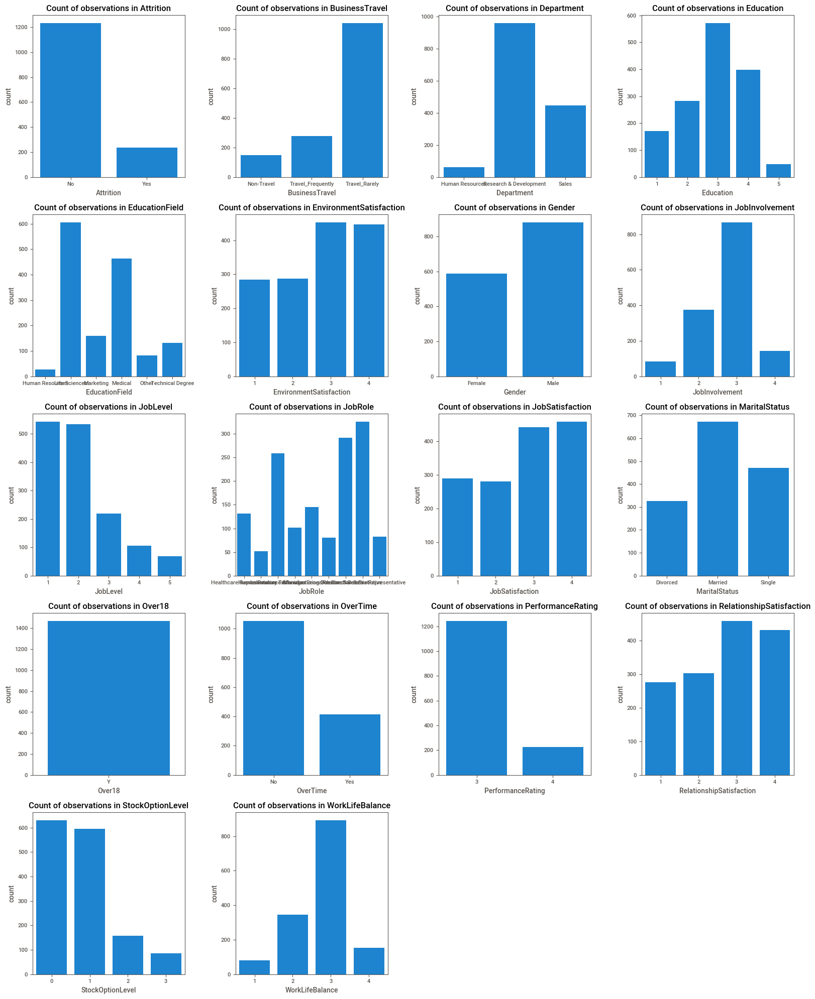

In [ ]:
%matplotlib inline

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Assuming 'df' is your DataFrame

# Select only categorical columns with the "category" data type
categorical_columns = df.select_dtypes(include='category').columns

# Calculate the number of rows and columns for subplots
num_columns = 4
num_rows = math.ceil(len(categorical_columns) / num_columns)

# Set up subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 4 * num_rows))  # Adjust the figure size as needed

# Flatten the axes array to make it easier to index
axes = axes.flatten()

# Loop through each categorical column and create a countplot in a subplot
for i, column in enumerate(categorical_columns):
    sns.countplot(x=column, data=df, ax=axes[i])
    axes[i].set_title(f'Count of observations in {column}')

# Remove any empty subplots
for i in range(len(categorical_columns), num_rows * num_columns):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()



Graphs for the continuous variables:

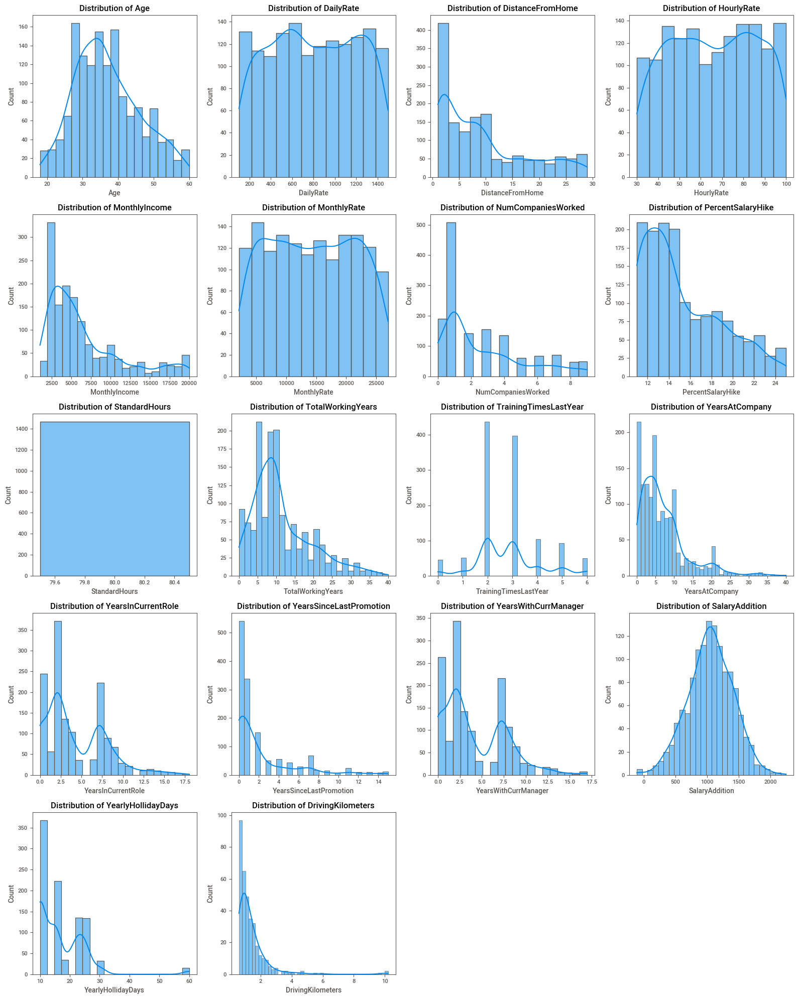

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Assuming 'df' is your DataFrame

# Select only numeric columns with non-empty and non-"unnamed" names
numeric_columns = [col for col in df.select_dtypes(include='number').columns if col.strip() and 'unnamed' not in col.lower()]

# Calculate the number of rows and columns for subplots
num_columns = 4
num_rows = math.ceil(len(numeric_columns) / num_columns)

# Set up subplots with adjusted height_ratios
fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 4 * num_rows),
                         gridspec_kw={'height_ratios': [4] * num_rows})  # Adjust the figure size as needed

# Flatten the axes array to make it easier to index
axes = axes.flatten()

# Loop through each numeric column and create a displot with a smoothed line
for i, column in enumerate(numeric_columns):
    sns.histplot(df[column], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')

# Remove any empty subplots
for i in range(len(numeric_columns), num_rows * num_columns):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


####3. Using boxplots to detect which variables have extreme values (outliers).

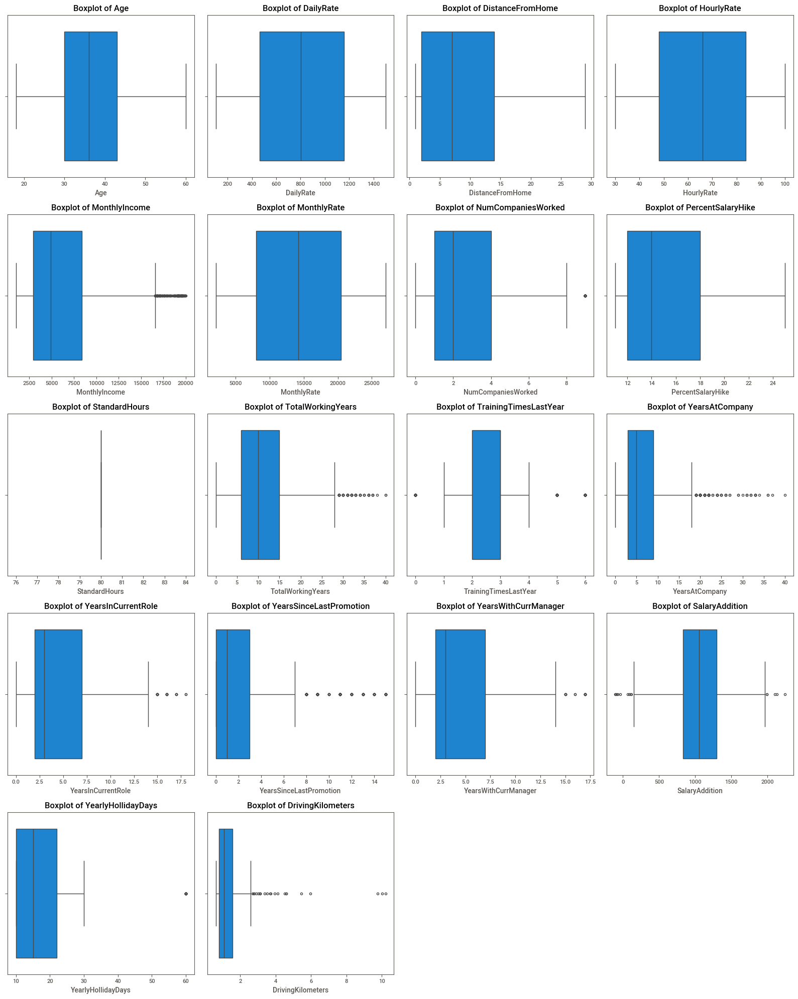

In [ ]:
%matplotlib inline

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Assuming 'df' is your DataFrame

# Select only numeric columns with non-empty and non-"unnamed" names
numeric_columns = [col for col in df.select_dtypes(include='number').columns if col.strip() and 'unnamed' not in col.lower()]

# Calculate the number of rows and columns for subplots
num_columns = 4  # Adjust the number of columns as needed
num_rows = math.ceil(len(numeric_columns) / num_columns)

# Set up subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 4 * num_rows))  # Adjust the figure size as needed

# Flatten the axes array to make it easier to index
axes = axes.flatten()

# Loop through each numeric column and create a boxplot in a subplot
for i, column in enumerate(numeric_columns):
    sns.boxplot(x=df[column], ax=axes[i])
    axes[i].set_title(f'Boxplot of {column}')

# Remove any empty subplots
for i in range(len(numeric_columns), num_rows * num_columns):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

The outliers we can see in this boxplots are:
* NumCompniesWorked > 8
* Monthlyincome > 16,000
* TotalWorkingYears > 28
* YearsAtCompany > 18
* YeasInCurrentRole > 14
* YearsSinceLastPromotion > 7.5
* YearsWithCurrManager > 14
* SalaryAddition <= 100 OR SalaryAddition >= 2000
* YearlyHolidayDays >= 60
* DrivingKilometers >= 2.5

####4. By using graphs (scatterplots) and statistical analysis, we are checking the correlation between the numeric variables.


First, we'll use a pairplot to show the relationship between any two numeric variables.

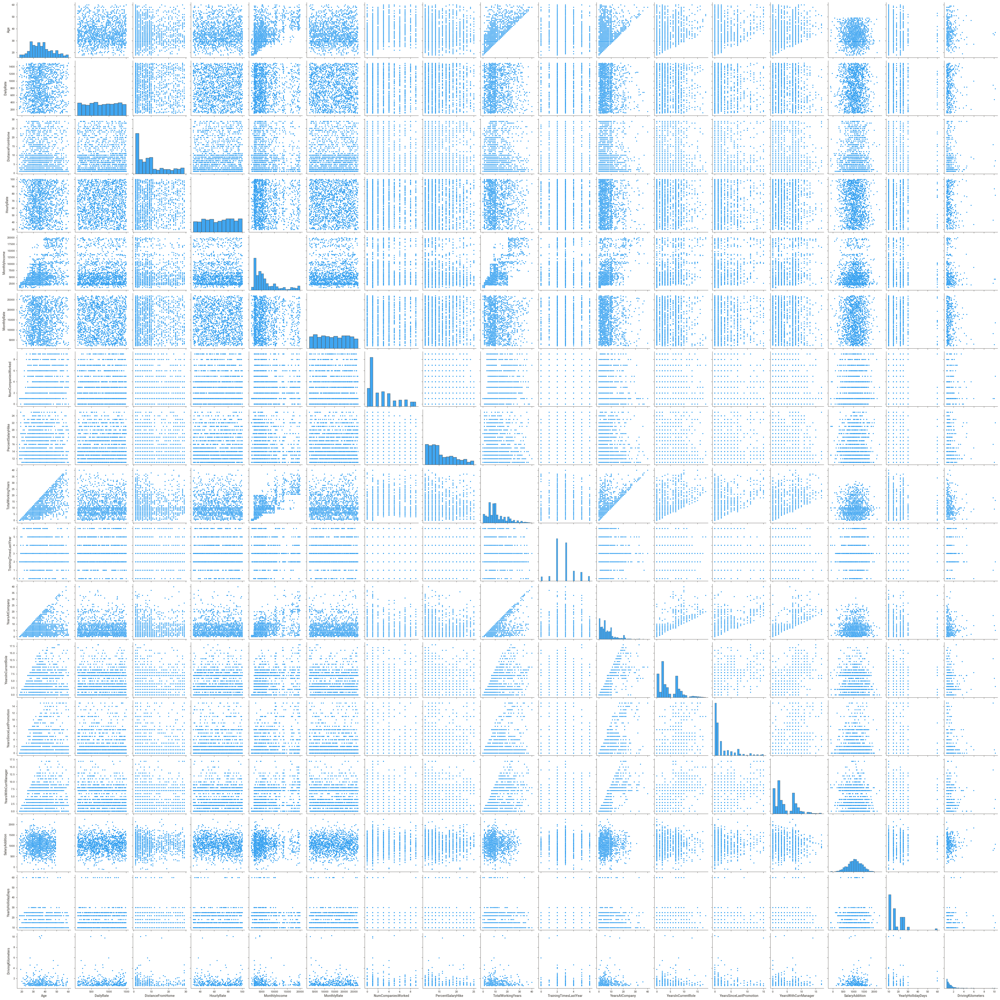

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'df'
# Select only numeric columns excluding 'unnamed:0'
numeric_df = df.select_dtypes(include='number').drop(columns=['Unnamed: 0', 'StandardHours'], errors='ignore')

# Create pairplot for numeric variables
sns.pairplot(numeric_df)
plt.show()

In pairplots there are many variables, so it is quite difficult to clearly see the relationships between them. It would be simpler in my opinion, to use a correlation matrix that shows the linear relationship between any 2 continuous variables using colors and numbers. A high positive correlation is one that is close to 1 and a high negative correlation is one that is close to minus 1.

Now i will use shapiro test to decide which type of correlation martix is the best fit for my data. If the variables have a normal distribution, i will use Pearson correlation, and if they don't, i will use Spearman correlation.

In [ ]:
import pandas as pd
from scipy.stats import shapiro

# יצירת דוגמה לנתונים נומריים מתוך DataFrame
numeric_columns = df.select_dtypes(include='number').drop(columns=['Unnamed: 0', 'StandardHours']).columns.tolist()

# בדיקת התאמה להתפלגות נורמלית עבור כל עמודה נומרית בנפרד
for column in numeric_columns:
    stat, p_value = shapiro(df[column])
    if p_value > 0.05:
        print(f"The data in column '{column}' is normally distributed")
    else:
        print(f"The data in column '{column}' is not normally distributed")

The data in column 'Age' is not normally distributed
The data in column 'DailyRate' is not normally distributed
The data in column 'DistanceFromHome' is not normally distributed
The data in column 'HourlyRate' is not normally distributed
The data in column 'MonthlyIncome' is not normally distributed
The data in column 'MonthlyRate' is not normally distributed
The data in column 'NumCompaniesWorked' is normally distributed
The data in column 'PercentSalaryHike' is not normally distributed
The data in column 'TotalWorkingYears' is not normally distributed
The data in column 'TrainingTimesLastYear' is normally distributed
The data in column 'YearsAtCompany' is not normally distributed
The data in column 'YearsInCurrentRole' is not normally distributed
The data in column 'YearsSinceLastPromotion' is normally distributed
The data in column 'YearsWithCurrManager' is not normally distributed
The data in column 'SalaryAddition' is normally distributed
The data in column 'YearlyHollidayDays' is

Most of the numeric variables don't have a normal distribution, so i am going to use the Spearman correlation method in order to see the relationship between the numeric variables.

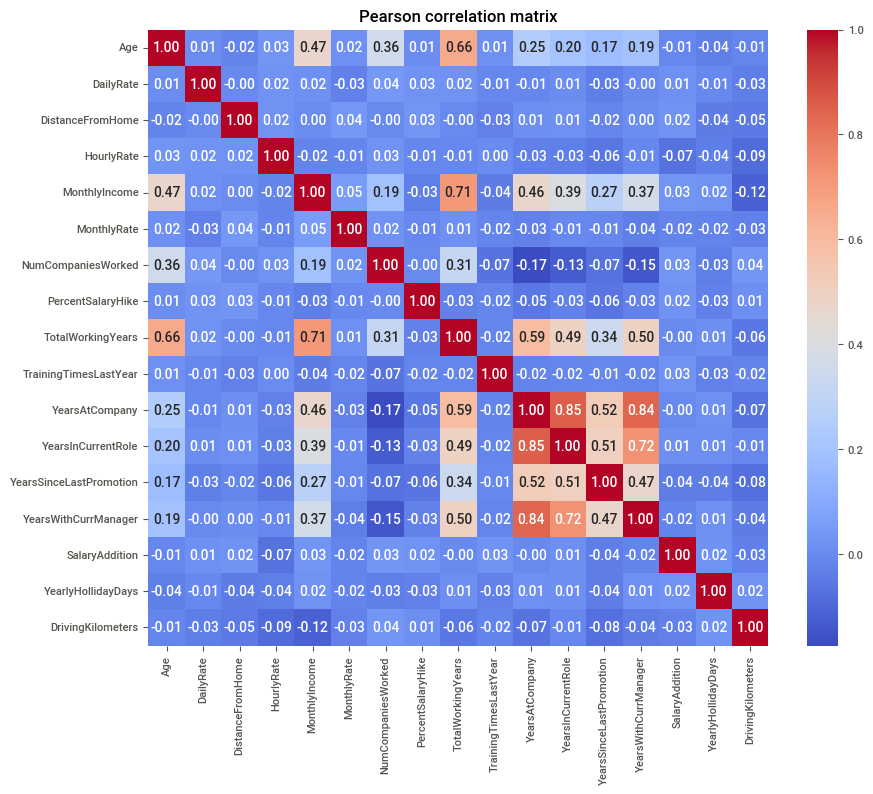

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# הנחה: df היא DataFrame שלך
# תבצעי חיתוך של העמודות הנומריות ב- df
numeric_columns = df.select_dtypes(include='number').drop(columns=['Unnamed: 0', 'StandardHours'], errors='ignore')

# יצירת מטריצת קורלציה
correlation_matrix = numeric_columns.corr(method='spearman')

# השתמשי ב Seaborn ליצירת חום-מפת קורלציה
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Pearson correlation matrix")
plt.show()

We can see high correlation between these variables:
* Age + TotalWorkingYears = 0.66
* MonthlyIncome + TotalWorkingYears = 0.71
* TotalWorkingYears + YearsAtCompany = 0.59
* YearsAtCompany + YearsInCurrentRole = 0.85
* YearsAtCompany + YearsSinceLastPromotion = 0.52
* YearsAtCompany + YearsWithCurrManager = 0.84
* YearsInCurrentRole + YearsWithCurrManager = 0.72
* MonthlyIncome + Age = 0.47
* MonthlyIncome + YearsAtCompany = 0.46

Now i will use pairplot only for the variables that have high correlation between them, in order to see the connections between them more clearly.

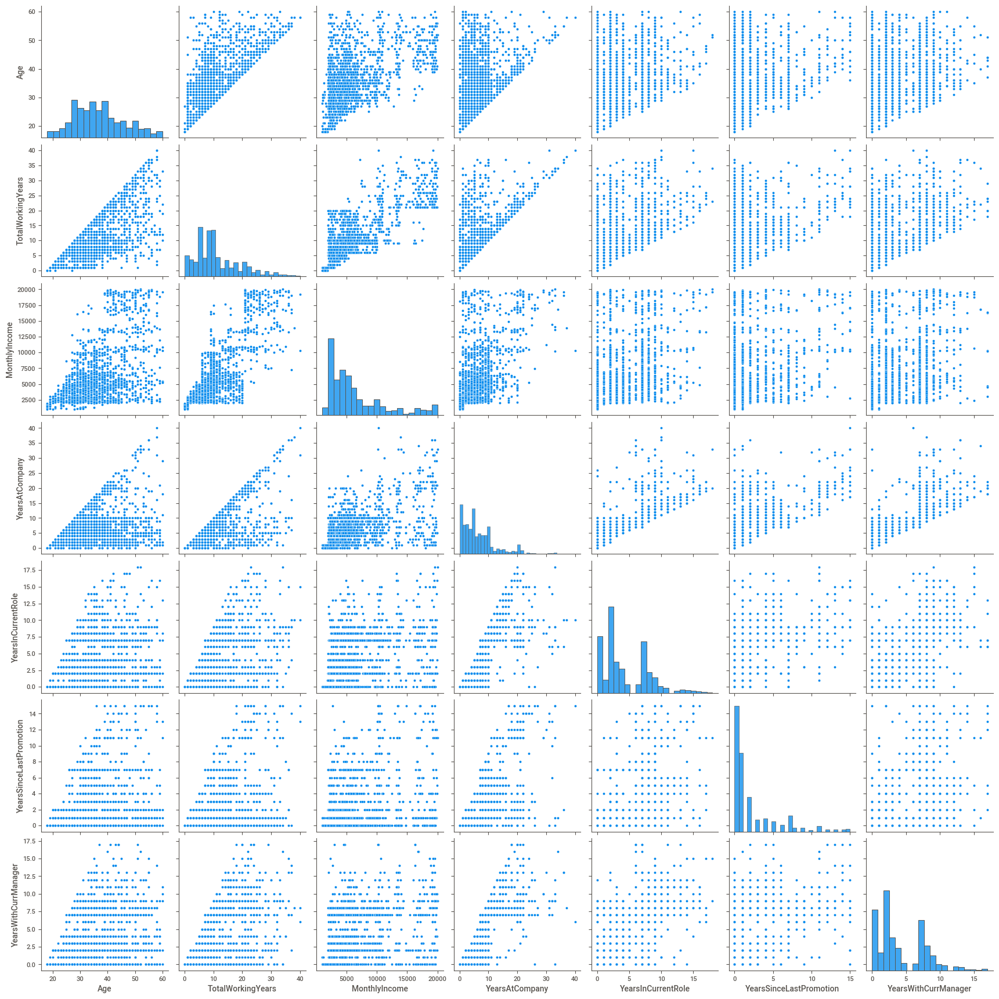

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'df'
# Select only numeric columns excluding 'unnamed:0'
high_correlated = ['Age', 'TotalWorkingYears', 'MonthlyIncome', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
numeric_df = df[high_correlated].select_dtypes(include='number')

# Create pairplot for numeric variables
sns.pairplot(numeric_df)
plt.show()

Now we can see the connections between the variables more clearly.

####5. By using graphs (histograms/distribution plots) and statistical analysis, I will check the difference of the numeric variables within categories of different categorical variables.


Now I am going to use statistical analysis to check the differences between the numeric variables within categories of different categorical variables.
I am going to use the Shapiro test in order to check the distribution of the variables to see if I can use ANOVA for this examination. If the distributions are normal, I can use ANOVA, and if they don't then I will use the Kruskal-Wallis test.

In [ ]:
import pandas as pd
from scipy.stats import shapiro

# יצירת דוגמה לנתונים נומריים מתוך DataFrame
numeric_columns = df.select_dtypes(include='number').drop(columns=['Unnamed: 0', 'StandardHours']).columns.tolist()

# בדיקת התאמה להתפלגות נורמלית עבור כל עמודה נומרית בנפרד
for column in numeric_columns:
    stat, p_value = shapiro(df[column])
    if p_value > 0.05:
        print(f"The data in column '{column}' is normally distributed")
    else:
        print(f"The data in column '{column}' is not normally distributed")

The data in column 'Age' is not normally distributed
The data in column 'DailyRate' is not normally distributed
The data in column 'DistanceFromHome' is not normally distributed
The data in column 'HourlyRate' is not normally distributed
The data in column 'MonthlyIncome' is not normally distributed
The data in column 'MonthlyRate' is not normally distributed
The data in column 'NumCompaniesWorked' is normally distributed
The data in column 'PercentSalaryHike' is not normally distributed
The data in column 'TotalWorkingYears' is not normally distributed
The data in column 'TrainingTimesLastYear' is normally distributed
The data in column 'YearsAtCompany' is not normally distributed
The data in column 'YearsInCurrentRole' is not normally distributed
The data in column 'YearsSinceLastPromotion' is normally distributed
The data in column 'YearsWithCurrManager' is not normally distributed
The data in column 'SalaryAddition' is normally distributed
The data in column 'YearlyHollidayDays' is

Because not all the numeric variables are normally distributed, i can't use ANOVA and i have to find another statistical test.
Therefore, I can use the Kruskal-Wallis test.

In [ ]:
import pandas as pd
from scipy.stats import kruskal

# Assuming df is your DataFrame
categorical_columns = df.select_dtypes(include='category').columns.tolist()
numeric_columns = df.select_dtypes(include='number').drop(columns=['Unnamed: 0', 'StandardHours']).columns.tolist()

# Create a dictionary to store Kruskal-Wallis results
kruskal_results = {}

# Loop over each categorical variable
for category_column in categorical_columns:
    # Create a list to store tuples for the current categorical variable
    category_results = []

    # Loop over each numeric variable
    for numeric_column in numeric_columns:
        # Extract unique values for the current category
        unique_values = df[category_column].unique()

        # Check if there are at least two unique values in the current category
        if len(unique_values) < 2:
            continue

        # Kruskal-Wallis Test
        stat, p_value = kruskal(*[df[numeric_column][df[category_column] == category_value] for category_value in unique_values])

        # Store the results in the list
        category_results.append((numeric_column, p_value))

    # Store the list of tuples in the dictionary
    kruskal_results[category_column] = category_results

# Print the results
for category_column, results in kruskal_results.items():
    print(f"\nKruskal-Wallis Test results for {category_column}:")
    for result in results:
        numeric_column, p_value = result
        if p_value < 0.05:
            print(f"  There is a significant difference in {numeric_column}.")
            print(f"  The p-value is: {round(p_value, 4)}")



Kruskal-Wallis Test results for Attrition:
  There is a significant difference in Age.
  The p-value is: 0.0
  There is a significant difference in DailyRate.
  The p-value is: 0.029
  There is a significant difference in DistanceFromHome.
  The p-value is: 0.0024
  There is a significant difference in MonthlyIncome.
  The p-value is: 0.0
  There is a significant difference in TotalWorkingYears.
  The p-value is: 0.0
  There is a significant difference in YearsAtCompany.
  The p-value is: 0.0
  There is a significant difference in YearsInCurrentRole.
  The p-value is: 0.0
  There is a significant difference in YearsWithCurrManager.
  The p-value is: 0.0

Kruskal-Wallis Test results for BusinessTravel:

Kruskal-Wallis Test results for Department:
  There is a significant difference in MonthlyIncome.
  The p-value is: 0.0

Kruskal-Wallis Test results for Education:
  There is a significant difference in Age.
  The p-value is: 0.0
  There is a significant difference in MonthlyIncome.
  T

To complete the test, we will also need to specifically test which pairs of categories are significant against the numeric variable when the categorical variable has 3 or more categories. For example, the education variable is significant against age, but we would like to know which types of education have a significant difference against age. For example, there is a clear difference in the age of employees, between those with a high school education and those with an academic one. That is, just saying that the education variable is significant compared to age is not enough, and we would like to do a more nuanced examination.

The test we will use for 3 and more categories is Dunn's test. Dunn's test is a post hoc test used to examine pairwise differences between groups when there are more than two categories. The test is applied in cases where significant results are obtained from the Kruskal-Wallis test, which is used to assess statistical differences among three or more groups.

The test works by conducting a certain number of comparisons between each pair of groups. Subsequently, p-values are obtained for each of these comparisons. The lower the p-values, the higher the statistical distinction between the groups.


For example, in cell (1, 2) in the education variable, the p-value is 5.428008e-08, which is very low. This indicates a significant distinction between category 1 and category 2 regarding the numeric variable "Age." Similarly, cell (2, 3) signifies a significant difference between category 2 and category 3, and so on.

In [ ]:
!pip install scikit-posthocs

In [ ]:
import pandas as pd
from scipy.stats import kruskal
import scikit_posthocs as sp

# Assuming df is your DataFrame
categorical_columns = df.select_dtypes(include='category').columns.tolist()
numeric_columns = df.select_dtypes(include='number').drop(columns=['Unnamed: 0', 'StandardHours']).columns.tolist()

# Create dictionaries to store Kruskal-Wallis and Dunn's test results
kruskal_results = {}
dunn_results = {}

# Loop over each categorical variable
for category_column in categorical_columns:
    # Create lists to store tuples for the current categorical variable
    kruskal_category_results = []
    dunn_category_results = []

    # Loop over each numeric variable
    for numeric_column in numeric_columns:
        # Extract unique values for the current category
        unique_values = df[category_column].unique()

        # Check if there are at least three unique values in the current category
        if len(unique_values) < 3:
            continue

        # Kruskal-Wallis Test
        stat, p_value = kruskal(*[df[numeric_column][df[category_column] == category_value] for category_value in unique_values])

        # Store Kruskal-Wallis results in the list
        kruskal_category_results.append((numeric_column, p_value))

        # Check if the p-value is less than 0.05 for Dunn's test
        if p_value < 0.05:
            # Dunn's test
            dunn_result = sp.posthoc_dunn([df[numeric_column][df[category_column] == category_value] for category_value in unique_values], p_adjust='holm')

            # Store Dunn's test results in the list
            dunn_category_results.append((numeric_column, dunn_result))

    # Store the lists of tuples in the dictionaries
    kruskal_results[category_column] = kruskal_category_results
    dunn_results[category_column] = dunn_category_results


# Print the Dunn's test results
for category_column, results in dunn_results.items():
    print(f"\nDunn's Test results for {category_column}:")
    for result in results:
        numeric_column, dunn_result = result
        print(f"  Dunn's test results for {numeric_column}:")
        print(dunn_result)




Dunn's Test results for Attrition:

Dunn's Test results for BusinessTravel:

Dunn's Test results for Department:
  Dunn's test results for MonthlyIncome:
              1             2         3
1  1.000000e+00  4.329774e-10  0.004707
2  4.329774e-10  1.000000e+00  0.746533
3  4.707436e-03  7.465329e-01  1.000000

Dunn's Test results for Education:
  Dunn's test results for Age:
              1             2             3             4             5
1  1.000000e+00  5.428008e-08  7.440979e-03  7.553864e-01  8.188682e-02
2  5.428008e-08  1.000000e+00  7.826826e-18  8.033232e-08  1.849985e-07
3  7.440979e-03  7.826826e-18  1.000000e+00  1.095830e-05  7.553864e-01
4  7.553864e-01  8.033232e-08  1.095830e-05  1.000000e+00  2.606609e-02
5  8.188682e-02  1.849985e-07  7.553864e-01  2.606609e-02  1.000000e+00
  Dunn's test results for MonthlyIncome:
          1         2         3         4         5
1  1.000000  0.087422  0.122615  0.996202  0.018879
2  0.087422  1.000000  0.000278  0.065615

Now i will use 2 types of graphs to see the differences between the different categories within the numeric variable. I will show only the categorical variables that were found to be significant (p_value < 0.05) in the Kruskal-Wallis Test.

* The variables that do not appear in the boxplots will appear in the hisplots.

### Boxplots:

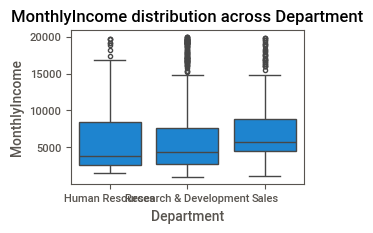

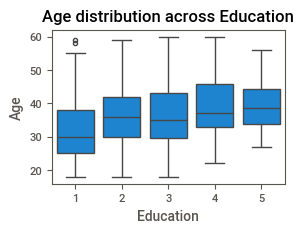

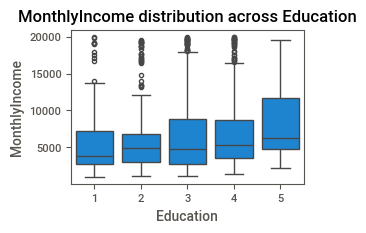

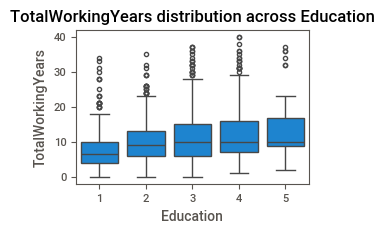

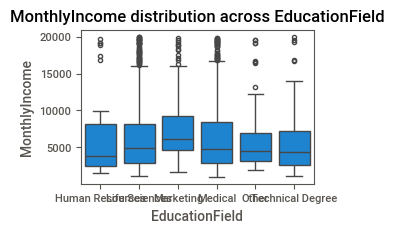

...

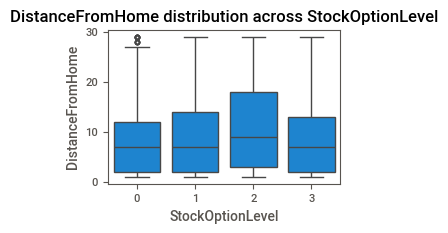

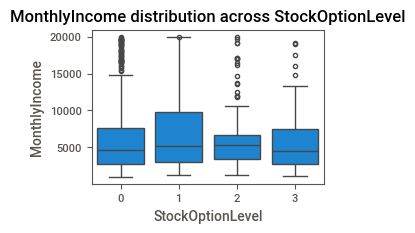

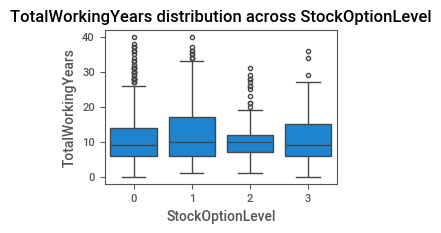

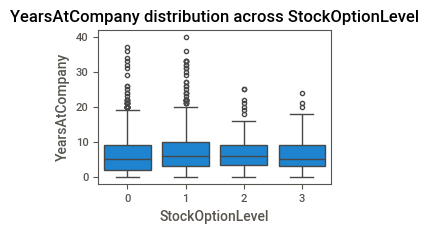

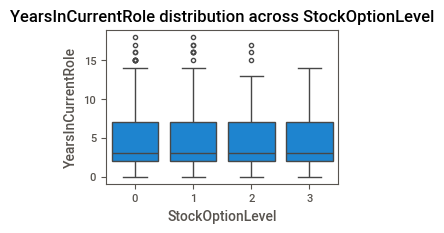

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
for category_column, results in kruskal_results.items():
    for result in results:
        numeric_column, p_value = result
        if p_value < 0.05:
            plt.figure(figsize=(3, 2))
            sns.boxplot(x=category_column, y=numeric_column, data=df)
            plt.title(f'{numeric_column} distribution across {category_column}')
            plt.show()


### Hisplots:


Column names in the DataFrame:
Index(['Unnamed: 0', 'Attrition', 'Age', 'BusinessTravel', 'DailyRate',
       'Department', 'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'Over18',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'SalaryAddition', 'YearlyHollidayDays',
       'DrivingKilometers'],
      dtype='object')


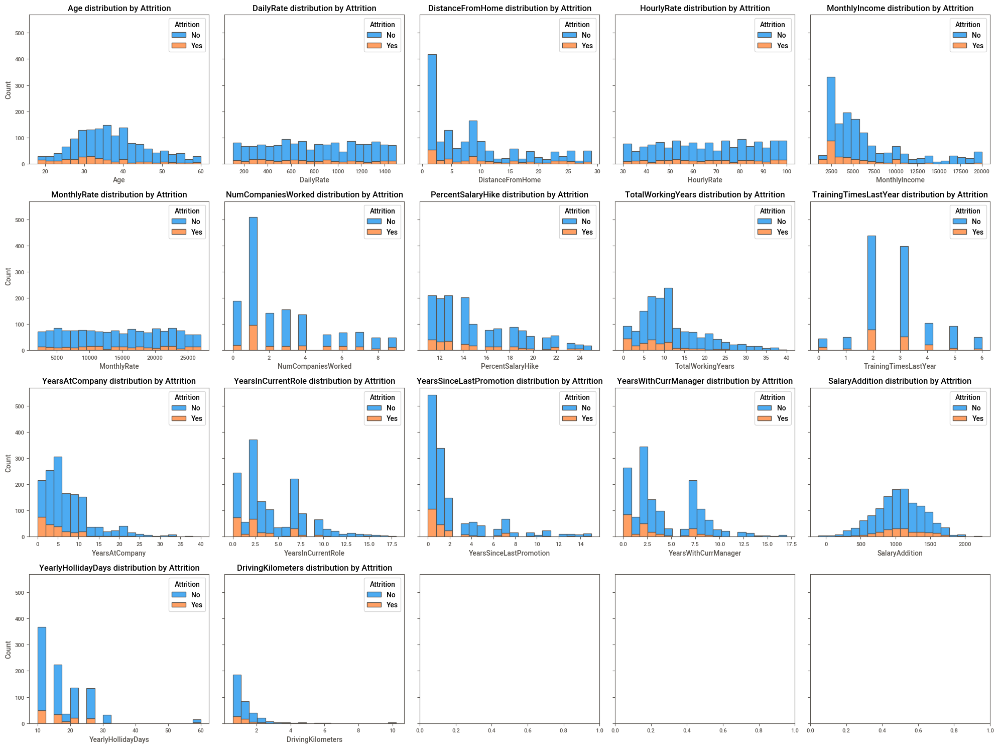

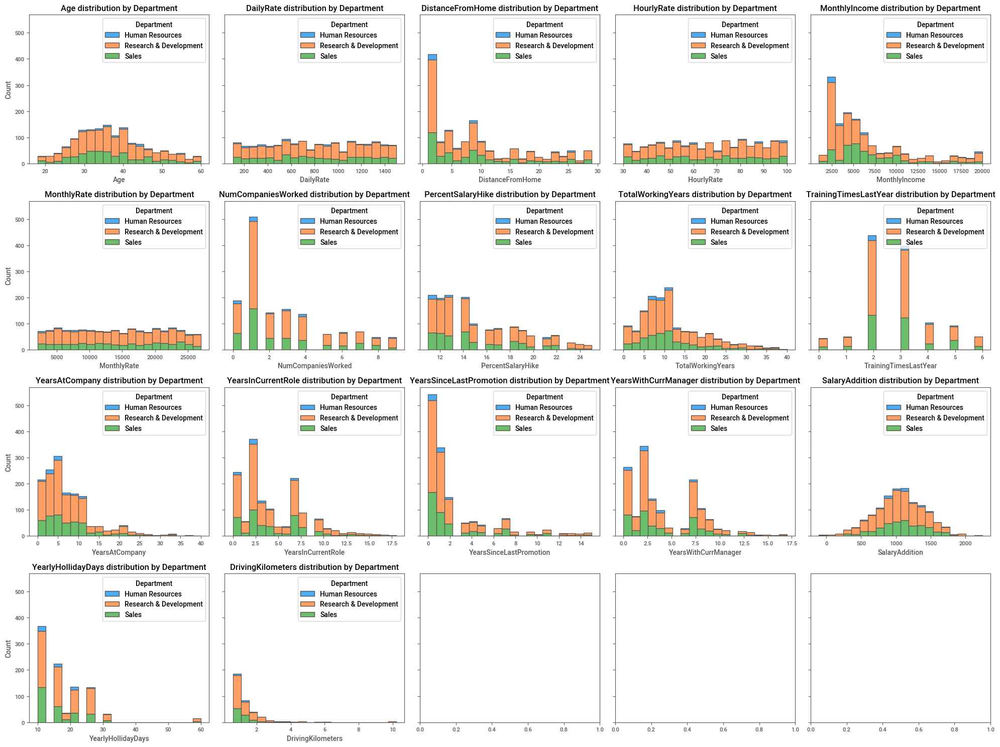

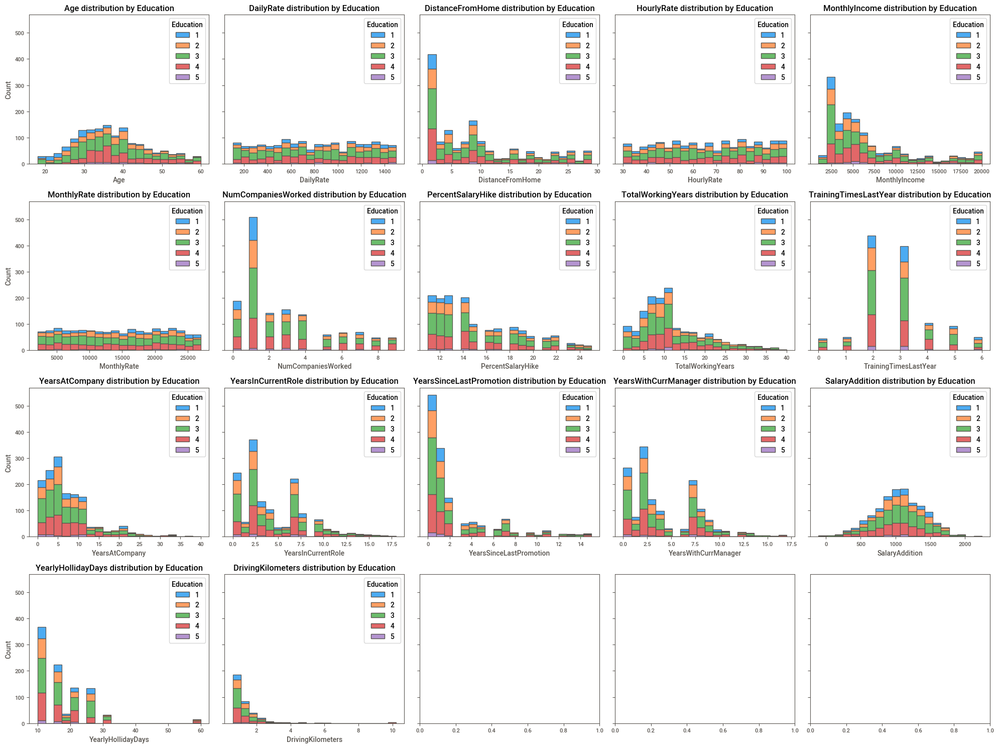

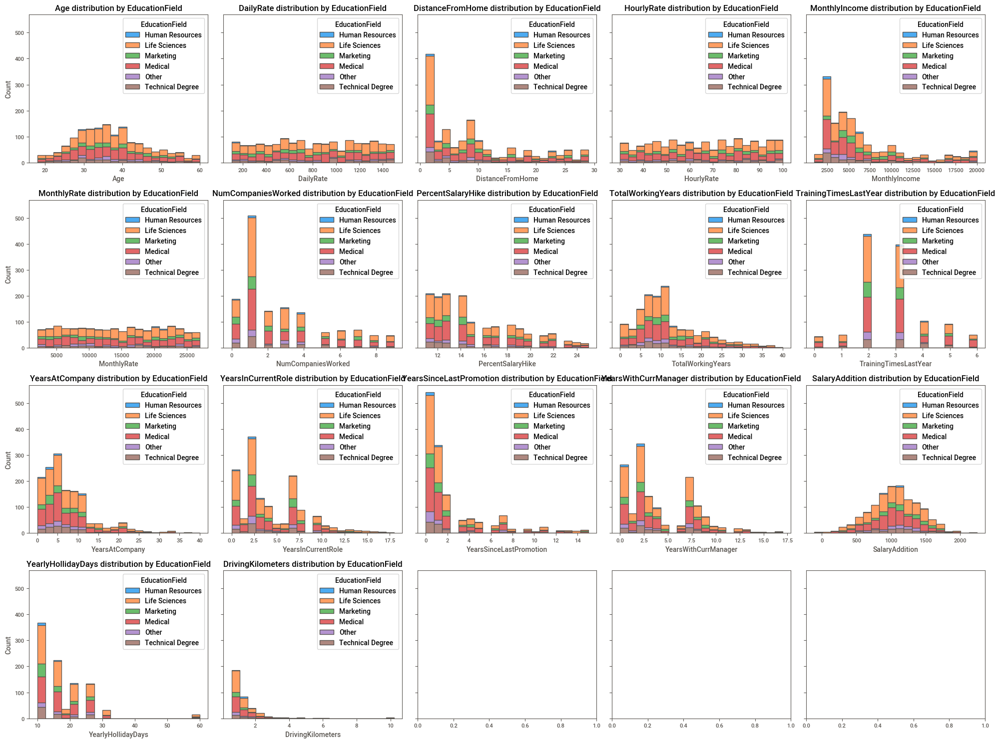

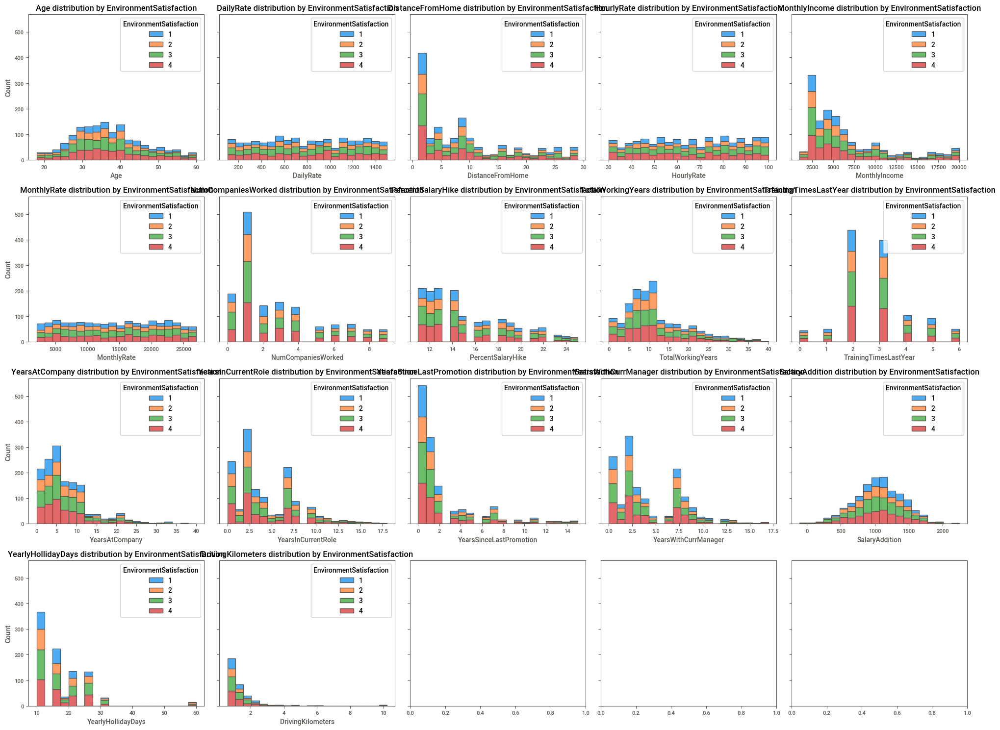

...

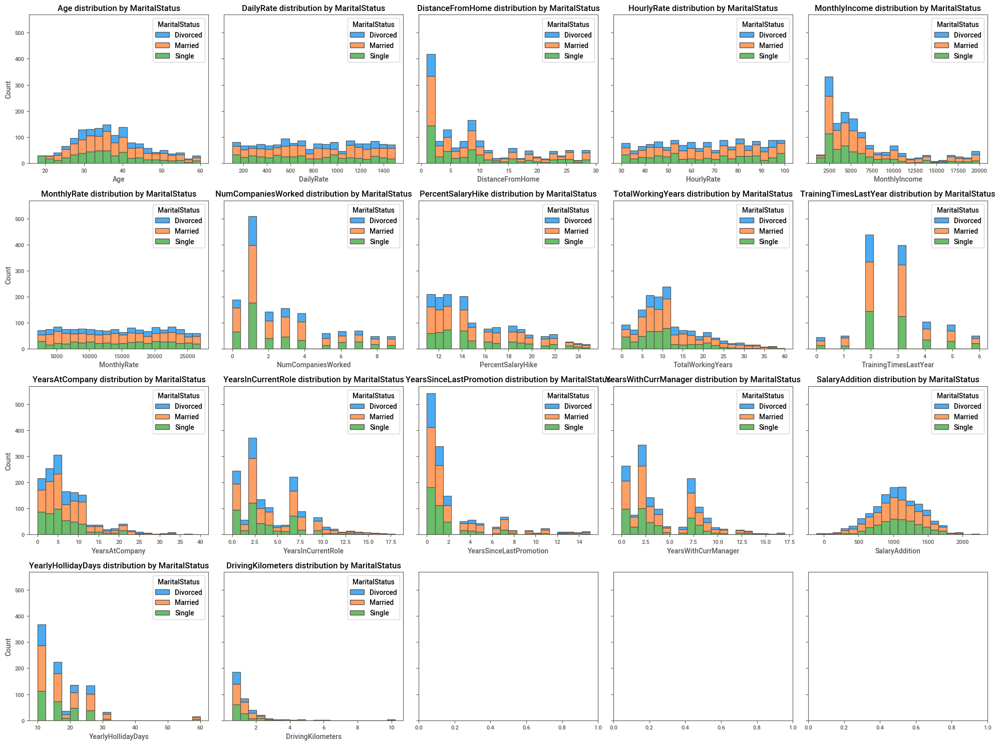

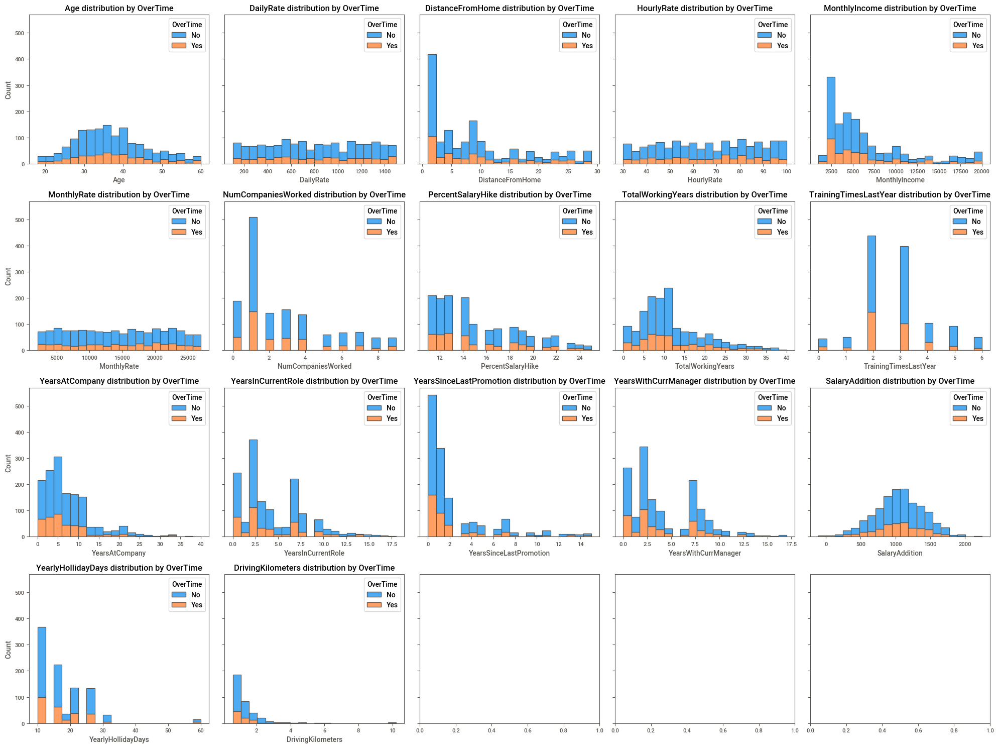

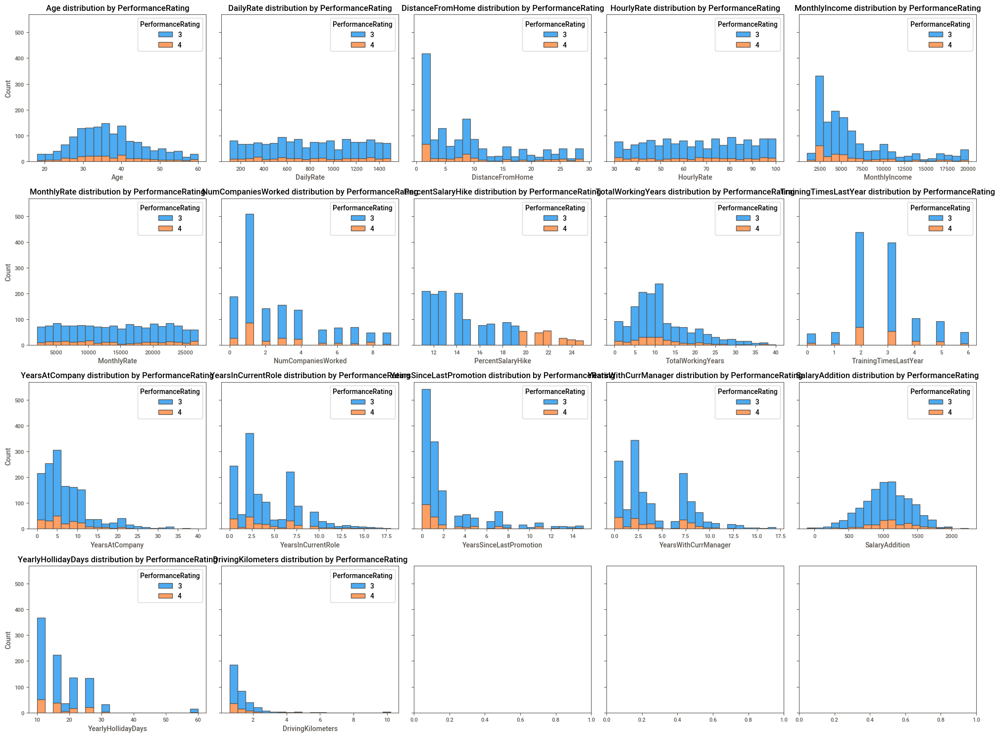

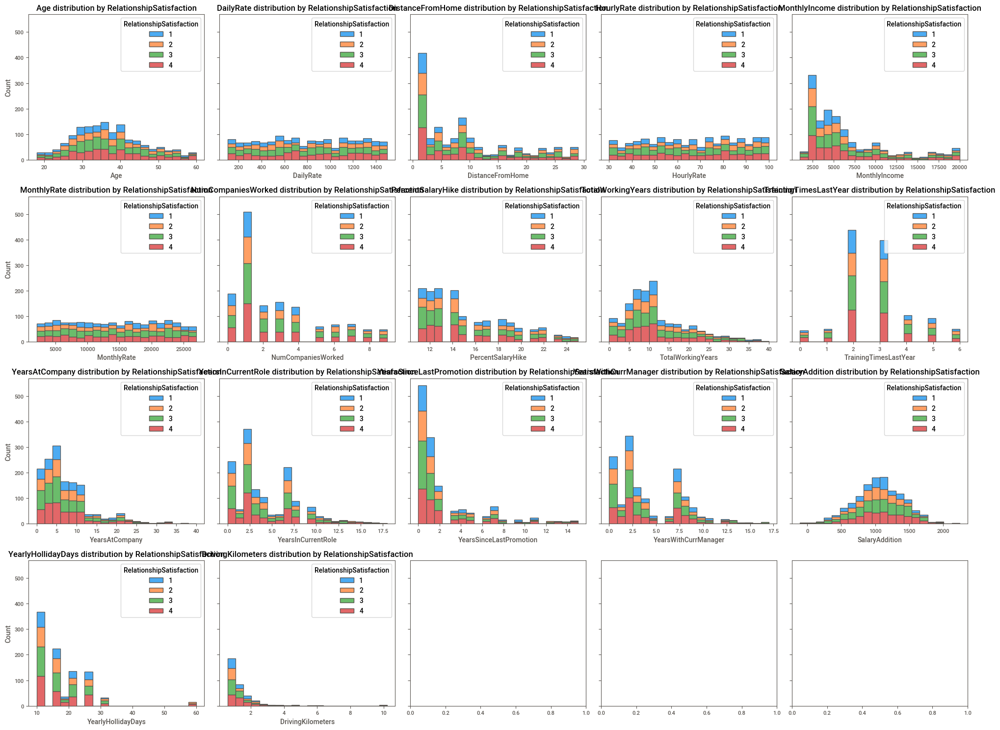

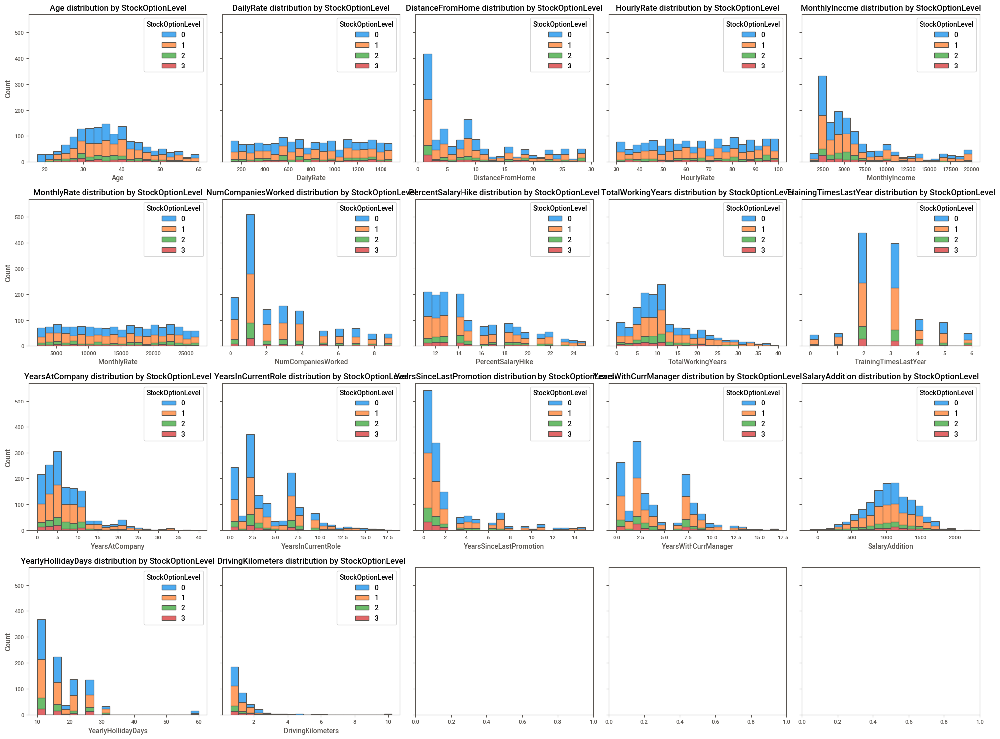

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with both numeric and categorical variables

# Print the column names in your DataFrame
print("Column names in the DataFrame:")
print(df.columns)


# Find all columns whose type is numeric (excluding 'category' type)
numeric_variables = df.select_dtypes(include='number').drop(columns=['Unnamed: 0', 'StandardHours']).columns.tolist()

# Exclude specific categories that may cause issues
include_categories = ['Attrition', 'Department', 'Education', 'EducationField', 'EnvironmentSatisfaction', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
                      'OverTime', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel']  # Add more if needed


# Find all columns whose type is 'category'
categorical_variables = df[include_categories]


# Function to add legend to each subplot
def add_legend(ax, title, colors):
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in colors]
    ax.legend(handles, title.unique(), title=title, loc="upper right")

# Loop through categorical variables
for chosen_categorical_var in categorical_variables:
  #  if chosen_categorical_var in include_categories:
        # Create subplots for numeric variables
        fig, axes = plt.subplots(nrows=len(numeric_variables) // 5 + 1, ncols=5, figsize=(20, 15), sharey=True)

        # Flatten axes for easier indexing
        axes = axes.flatten()

        # Loop through numeric variables and create histograms for each categorical variable
        for i, numeric_var in enumerate(numeric_variables):
            if i < len(axes):
                try:
                    # Check if the values are not all NaN (missing values)
                    if not df[numeric_var].isnull().all():
                        # Check if the numeric column has non-numeric values
                        if pd.api.types.is_numeric_dtype(df[numeric_var]):
                            # Create a separate histogram for each category using seaborn's histplot
                            sns.histplot(data=df, x=numeric_var, hue=chosen_categorical_var, multiple="stack", bins=20, alpha=0.7, ax=axes[i])
                            axes[i].set_title(f'{numeric_var} distribution by {chosen_categorical_var}')

                            # Add legend
                            add_legend(axes[i], chosen_categorical_var, df[chosen_categorical_var].unique())
                except Exception as e:
                    pass

        # Adjust layout
        plt.tight_layout()
        plt.show()

####6. By using PCA, we will check if there are any subgroups of individuals that can be identified.

I will use PCA on the variables that are associated with salary:
DailyRate, HourlyRate, MonthlyIncome, MonthlyRate, PercentSalaryHike.

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

In [ ]:
salary_columns = ['DailyRate', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate']

X = df[salary_columns]

In [ ]:
pca = PCA(n_components=3)
pca.fit(X)

print(pca.components_)

X_pca = pca.transform(X)

[[-1.81517782e-03 -4.48364865e-05  4.08329255e-02  9.99164338e-01]
 [ 8.38233326e-04 -6.41989265e-05  9.99165694e-01 -4.08314610e-02]
 [ 9.99997324e-01  1.16420997e-03 -7.63339159e-04  1.84793879e-03]]


In [ ]:
pca.explained_variance_ratio_.round(4)

array([0.6948, 0.303 , 0.0022])

In this case, the first component explains approximately 69.5% of the variance, and the second component explains about 30.3%. The additional components contribute very little to the overall variance. So, i am going to reduce the component number to 2.

In [ ]:
pca = PCA(n_components=2)
pca.fit(X)

PCA(n_components=2)

In [ ]:
print(pca.components_)

[[-1.81517782e-03 -4.48364865e-05  4.08329255e-02  9.99164338e-01]
 [ 8.38233326e-04 -6.41989265e-05  9.99165694e-01 -4.08314610e-02]]


In [ ]:
X_pca = pca.transform(X)
X_pca

array([[ 5.14021274e+03, -7.20187701e+02],
       [ 1.05299333e+04, -1.80478861e+03],
       [-1.20883744e+04, -3.92218027e+03],
       ...,
       [-9.14502973e+03,  1.19886791e+01],
       [-1.11505354e+03, -1.06812385e+03],
       [-4.16707914e+03, -1.93052670e+03]])

<Axes: >

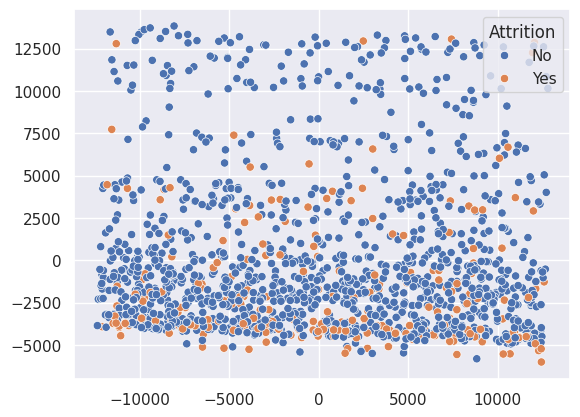

In [ ]:
sns.scatterplot(x=X_pca[:,0],y=X_pca[:,1], hue = df['Attrition'])

We can see that the points came out very mixed and cannot be separated into two clear groups. Although, in the upper part of the graph we can notice that there are more of the blue group than of the orange group.
We didn't find any subgroups of individuals that can be identified by PCA. Maybe if we will use cluster analysis we will be able to find clearer subgroups.

####7. Checking the missing values.


Checking the number of missing values for each variable that has NA values, and it's type. We won't show variables that have no missing values.

In [ ]:
# Assuming 'df' is your DataFrame
missing_values = df.isnull().sum()

# Select variables with missing values
variables_with_missing_values = missing_values[missing_values > 0].index.tolist()

# Create a DataFrame to store the percentage of missing values for each variable
missing_percentage_df = pd.DataFrame(columns=['Variable', 'Missing Percentage', 'Data Type'])

# Calculate and store the percentage of missing values for each variable
for variable in variables_with_missing_values:
    missing_percentage = (df[variable].isnull().sum() / len(df)) * 100
    data_type = df[variable].dtype
    missing_percentage_df = pd.concat([missing_percentage_df, pd.DataFrame({
        'Variable': [variable],
        'Missing Percentage': [missing_percentage],
        'Data Type': [data_type]
    })], ignore_index=True)

# Display the resulting DataFrame using to_markdown
print("Percentage of missing values and data types for each variable:")
print(missing_percentage_df.to_markdown(index=False))

Percentage of missing values and data types for each variable:
| Variable                |   Missing Percentage | Data Type   |
|:------------------------|---------------------:|:------------|
| NumCompaniesWorked      |              3.06122 | float64     |
| TrainingTimesLastYear   |             19.8639  | float64     |
| YearsSinceLastPromotion |              5.98639 | float64     |
| SalaryAddition          |             11.7687  | float64     |
| YearlyHollidayDays      |             35.9184  | float64     |
| DrivingKilometers       |             75.9864  | float64     |


We have to remove the variable "Driving Kilometers" because more than 70% of it's values are missing, therefore it becomes irrelevant. There is no variable with 40%-69% of missing values so we don't need to change any variable to category in this stage (maybe after checking the missing mechanisim of these variables). For the other 5 variables, we will check their missing mechanism: 'NumCompaniesWorked', 'TrainingTimesLastYear', 'YearsSinceLastPromotion',
'SalaryAddition' and 'YearlyHollidayDays'.


In [ ]:
df.isna().sum()

Unnamed: 0                     0
Attrition                      0
Age                            0
BusinessTravel                 0
DailyRate                      0
Department                     0
DistanceFromHome               0
Education                      0
EducationField                 0
EnvironmentSatisfaction        0
Gender                         0
HourlyRate                     0
JobInvolvement                 0
JobLevel                       0
JobRole                        0
JobSatisfaction                0
MaritalStatus                  0
MonthlyIncome                  0
MonthlyRate                    0
NumCompaniesWorked            45
Over18                         0
OverTime                       0
PercentSalaryHike              0
PerformanceRating              0
RelationshipSatisfaction       0
StandardHours                  0
StockOptionLevel               0
TotalWorkingYears              0
TrainingTimesLastYear        292
WorkLifeBalance                0
YearsAtCom

####8. Cleaning the data from outliers and describing which methods are the correct ones for each variable.

These are the outliers we found in question 3 using IQR method (boxplots):

NumCompniesWorked > 8

Monthlyincome > 16,000

TotalWorkingYears > 28

YearsAtCompany > 18

YearsInCurrentRole > 14

YearsSinceLastPromotion > 7.5

YearsWithCurrManager > 14

SalaryAddition <= 100 OR SalaryAddition >= 2000

YearlyHolidayDays >= 60

DrivingKilometers >= 2.5

This is the treatment method of the outliers:

* If we know the observation is true- we will leave the observation as it was.

* If we know the observation is not true- we will convert it to NA.

* If we don't know if the observation is true, we have to check the change in the correlation and the distribution without the outliers. If the correlation doesn't really change after dropping the outliers but the distribution is changed- we can convert the outliers to NAs, and we need to report this change in the distribution.
If the distribution doesn't really change without the outliers, but the correlation is changed- we can convert the outliers to NAs.
If the correlation *and* the distribution changed- we will leave the observations in the model as they were, and report about it.

In our case, we don't know if the observations are true, so we need to use the third option- checking the change of the distribution and the correlation.

First, i need to use a function that separates the variables that has outliers into 2 groups: with and without the outliers.
I am going to use a function we learned in class.

In [ ]:
def get_df_without_outliers(df, threshold=1.5):
    numeric_columns_names = df.select_dtypes("number").columns
    numeric_df = df[[name for name in numeric_columns_names]]
    Q1 = numeric_df.quantile(0.25)
    Q3 = numeric_df.quantile(0.75)
    IQR = Q3 - Q1
    no_outliers_df = numeric_df[(numeric_df >= (Q1 - threshold * IQR)) & (numeric_df <= (Q3 + threshold * IQR))]
    return no_outliers_df

The following explanation is from the class:

The following code implements an algorhitm that check if the correlation changes (becomes statistically insignificant) and if the distributions changes significantly. The first is checked using Spearman correlation, while the second is checked using the Kolmogorov Smirnov statistic . This method is non-parametric and check the differences betweem two distributions.

Instead of taking the variables that I think they have outliers, I took all the numeric variables just to be safe. So if there are 0 outliers in the variable, we will not handle these variable anyway.

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import norm

def independent_corr(xy, ab, n, n2=None, twotailed=True, conf_level=0.95, method='fisher'):
    if method == 'fisher':
        xy_z = 0.5 * np.log((1 + xy)/(1 - xy))
        ab_z = 0.5 * np.log((1 + ab)/(1 - ab))
        if n2 is None:
            n2 = n

        se_diff_r = np.sqrt(1/(n - 3) + 1/(n2 - 3))
        diff = xy_z - ab_z
        z = abs(diff / se_diff_r)
        p = (1 - norm.cdf(z))
        if twotailed:
            p *= 2

        return z, p
    elif method == 'zou':
        L1 = xy - 1.96 / np.sqrt(n - 3)
        U1 = xy + 1.96 / np.sqrt(n - 3)
        L2 = ab - 1.96 / np.sqrt(n2 - 3)
        U2 = ab + 1.96 / np.sqrt(n2 - 3)
        lower = xy - ab - pow((pow((xy - L1), 2) + pow((U2 - ab), 2)), 0.5)
        upper = xy - ab + pow((pow((U1 - xy), 2) + pow((ab - L2), 2)), 0.5)
        return lower, upper
    else:
        raise Exception('Wrong method!')

def OutliersRemoveDecisions(df, y_label, threshold=1.5, significant_level=0.05):
  #  included_numeric = ['NumCompaniesWorked', 'MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
 #                       'YearsWithCurrManager', 'SalaryAddition', 'YearlyHollidayDays', 'DrivingKilometers']
    included_numeric = df.select_dtypes("number").columns
    numeric_df = df[included_numeric]
    with_outliers_df = numeric_df
    without_outliers_df = get_df_without_outliers(numeric_df, threshold=1.5)

    distribution_change_df = []

    for name in included_numeric:
        with_outliers_series = with_outliers_df[name]
        without_outliers_series = without_outliers_df[name]


        ks_result = stats.ks_2samp(with_outliers_series, without_outliers_series)

        x_outliers = with_outliers_series
        x_no_outliers = without_outliers_series

        xy = x_outliers.corr(y_label, method='spearman')
        ab = x_no_outliers.corr(y_label, method='spearman')

        n = x_outliers.shape[0]
        n2 = x_no_outliers.shape[0]

        ftz_result = independent_corr(xy, ab, n, n2, method='fisher')
        totout = np.sum(with_outliers_series.count()) - np.sum(without_outliers_series.count())

        distribution_change_df.append(
            {
                'variable': name,
                'outliers_number': '{} ({})'.format(totout, np.round(totout*100/n, 2)),
                'distribution_change': '+' if ks_result[1] < significant_level else '-',
                'correlation_changed': '+' if ftz_result[1] < significant_level else '-',
                'drop': 'no' if (ks_result[1] < significant_level) and (ftz_result[1] < significant_level) else 'yes'
            }
        )

    return pd.DataFrame(distribution_change_df)

In [ ]:
OutliersRemoveDecisions(df, df.Attrition)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


,variable,outliers_number,distribution_change,correlation_changed,drop
0,Unnamed: 0,0 (0.0),-,-,yes
1,Age,0 (0.0),-,-,yes
2,DailyRate,0 (0.0),-,-,yes
3,DistanceFromHome,0 (0.0),-,-,yes
4,HourlyRate,0 (0.0),-,-,yes
5,MonthlyIncome,114 (7.76),+,-,yes
6,MonthlyRate,0 (0.0),-,-,yes
7,NumCompaniesWorked,49 (3.33),-,-,yes
8,PercentSalaryHike,0 (0.0),-,-,yes
9,StandardHours,0 (0.0),-,-,yes


We can see that we are able to convert all the outliers in these variables to NAs, because there is no significant change in the distribution and in the correlation at the same time.

There is a change in the distribution after removing the outliers in these variables: MonthlyIncome, TrainingTimesLastYear, YearsAtCompany, YearsSinceLastPromotion. But since the correlation doesn't significally change i can convert the outliers to NAs, and report the distribution change after converting the outliers.

I will use a function to convert all the outliers to NA's for the same data frame.

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats

def convert_outliers_to_na(df, threshold=1.5):
    numeric_columns = df.select_dtypes(include=np.number).drop(columns=['Unnamed: 0', 'StandardHours', 'Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyRate', 'PercentSalaryHike']).columns

    for col in numeric_columns:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - threshold * iqr
        upper_bound = q3 + threshold * iqr
        df[col] = np.where((df[col] < lower_bound) | (df[col] > upper_bound), np.nan, df[col])

    return df

df_without_outliers = convert_outliers_to_na(df)

In [ ]:
df.isna().sum()

Unnamed: 0                     0
Attrition                      0
Age                            0
BusinessTravel                 0
DailyRate                      0
Department                     0
DistanceFromHome               0
Education                      0
EducationField                 0
EnvironmentSatisfaction        0
Gender                         0
HourlyRate                     0
JobInvolvement                 0
JobLevel                       0
JobRole                        0
JobSatisfaction                0
MaritalStatus                  0
MonthlyIncome                114
MonthlyRate                    0
NumCompaniesWorked            94
Over18                         0
OverTime                       0
PercentSalaryHike              0
PerformanceRating              0
RelationshipSatisfaction       0
StandardHours                  0
StockOptionLevel               0
TotalWorkingYears             63
TrainingTimesLastYear        479
WorkLifeBalance                0
YearsAtCom

Verifying that the function has turned all outliers into NAs, meaning there are no more outliers in the data.

####9. Cleaning the data from missingness.


After we converted the outliers to NAs, we have new NAs in the dataframe and we need to repeat the check from question 7.

In [ ]:
# Assuming 'df' is your DataFrame
missing_values = df.isnull().sum()

# Select variables with missing values
variables_with_missing_values = missing_values[missing_values > 0].index.tolist()

# Create a DataFrame to store the percentage of missing values for each variable
missing_percentage_df = pd.DataFrame(columns=['Variable', 'Missing Percentage', 'Data Type'])

# Calculate and store the percentage of missing values for each variable
for variable in variables_with_missing_values:
    missing_percentage = (df[variable].isnull().sum() / len(df)) * 100
    data_type = df[variable].dtype
    missing_percentage_df = pd.concat([missing_percentage_df, pd.DataFrame({
        'Variable': [variable],
        'Missing Percentage': [missing_percentage],
        'Data Type': [data_type]
    })], ignore_index=True)

# Display the resulting DataFrame using to_markdown
print("Percentage of missing values and data types for each variable:")
print(missing_percentage_df.to_markdown(index=False))

Percentage of missing values and data types for each variable:
| Variable                |   Missing Percentage | Data Type   |
|:------------------------|---------------------:|:------------|
| MonthlyIncome           |             7.7551   | float64     |
| NumCompaniesWorked      |             6.39456  | float64     |
| TotalWorkingYears       |             4.28571  | float64     |
| TrainingTimesLastYear   |            32.585    | float64     |
| YearsAtCompany          |             7.07483  | float64     |
| YearsInCurrentRole      |             1.42857  | float64     |
| YearsSinceLastPromotion |            13.0612   | float64     |
| YearsWithCurrManager    |             0.952381 | float64     |
| SalaryAddition          |            12.7211   | float64     |
| YearlyHollidayDays      |            36.9388   | float64     |
| DrivingKilometers       |            77.483    | float64     |


We can see that the only variable with more then 70% of missing values is 'DrivingKilometers'. The rest of the variables have less than 40% of missing values, so for the rest of the variables we will check the missing mechanisms, and if the mechanisms are MCAR/MAR we will use imputation to fill the missing values.

First, we will delete the variable "DrivingKilometers" because it has more than 70% missing values, and therefore it is statistically insignificant.

In [ ]:
# Assuming 'DrivingKilometers' is the column you want to drop
df = df.drop('DrivingKilometers', axis=1)

In [ ]:
df.shape

(1470, 36)

Now we will check if there are rows with more than 50% of NAs in order to remove them.

In [ ]:
import pandas as pd

# Assuming 'df' is your DataFrame
threshold_percentage = 50  # Set the threshold percentage

# Calculate the percentage of missing values for each row
missing_percentage_per_row = (df.isnull().sum(axis=1) / df.shape[1]) * 100

# Identify rows with missing values exceeding the threshold
rows_to_drop = missing_percentage_per_row[missing_percentage_per_row >= threshold_percentage].index

# Store the rows to be dropped in a separate DataFrame
dropped_rows = df.loc[rows_to_drop]

# Drop rows exceeding the threshold
df_filtered = df.drop(rows_to_drop)

# Display the dropped rows
print("\nDropped rows:")
print(dropped_rows)



Dropped rows:
Empty DataFrame
Columns: [Unnamed: 0, Attrition, Age, BusinessTravel, DailyRate, Department, DistanceFromHome, Education, EducationField, EnvironmentSatisfaction, Gender, HourlyRate, JobInvolvement, JobLevel, JobRole, JobSatisfaction, MaritalStatus, MonthlyIncome, MonthlyRate, NumCompaniesWorked, Over18, OverTime, PercentSalaryHike, PerformanceRating, RelationshipSatisfaction, StandardHours, StockOptionLevel, TotalWorkingYears, TrainingTimesLastYear, WorkLifeBalance, YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager, SalaryAddition, YearlyHollidayDays]
Index: []

[0 rows x 36 columns]


We can see that there are no rows with more than 50% of NAs, so we didn't drop any row. Now will check the missing mechanisms for the rest of the variables.

####Checking the missing mechanisms: MCAR/MAR/MNAR.

* If the probability of being missing is the same for all cases, then the data are said to be missing completely at random (MCAR).

* If the probability of being missing is the same only within groups defined by the observed data, then the data are missing at random (MAR).

* If neither MCAR nor MAR holds, then we speak of missing not at random (MNAR).
In the test we will conduct below we will check if there are any variables that their missing mechanisms are MNAR.


Now, we are going to check the missing mechanisims of the numeric variables, using the code from the class. If the imputation == 'no' then the missing mechanism is MNAR, and therefore we can't use imputation for the NAs.

Explaintion of the test:
We divided each variable that had NAs into two parts: one part has only non-missing values and a second part that has only missing values.
We compared the variable to each of the other numeric variables and checked if there was a significant difference between the distribution of the second variable with and without missing values of the first variable.

For example: the difference in the age variable with and without missing values of the height variable. If there is a significant difference, i.e. the p-value < 0.05, that means that there is no randomness of the missing values and therefore the type of mechanism of the missing values is MNAR.

As a result, we will not be able to use imputation for this variable, and we will have to convert it to a categorical variable with an additional category called "Unknown".

In [ ]:
from scipy import stats

def MissingMechanism(df, significant_level=0.05):
    missing_matt = df.isna()
    numeric_columns_names = df.select_dtypes("number").drop(columns=['Unnamed: 0', 'StandardHours']).columns
    distribution_change_df = {}  # pd.DataFrame()
    i = 0
    for numeric_missing_column_name in numeric_columns_names:
        # Check if the current numeric variable has missing values
        if missing_matt[numeric_missing_column_name].any():
            df_without_na = df[missing_matt[numeric_missing_column_name] == 0]
            for numeric_column_name in numeric_columns_names:
                if numeric_missing_column_name != numeric_column_name:
                    series_with_na = df[numeric_column_name]
                    series_without_na = df_without_na[numeric_column_name]
                    ks_result = stats.ks_2samp(series_with_na, series_without_na)
                    distribution_change_df[i] = {
                        'var_1_missing': numeric_missing_column_name,
                        'var_2': numeric_column_name,
                        'missings_number': sum(missing_matt[numeric_missing_column_name]),
                        'distribution_changed': '+' if ks_result[1] < significant_level else '-',
                        'imputation': 'no' if ks_result[1] < significant_level else 'yes'
                    }
                    i += 1

    return pd.DataFrame(distribution_change_df).transpose()


In [ ]:
res = MissingMechanism(df)
res

,var_1_missing,var_2,missings_number,distribution_changed,imputation
0,MonthlyIncome,Age,114,-,yes
1,MonthlyIncome,DailyRate,114,-,yes
2,MonthlyIncome,DistanceFromHome,114,-,yes
3,MonthlyIncome,HourlyRate,114,-,yes
4,MonthlyIncome,MonthlyRate,114,-,yes
...,...,...,...,...,...
145,YearlyHollidayDays,YearsAtCompany,543,-,yes
146,YearlyHollidayDays,YearsInCurrentRole,543,-,yes
147,YearlyHollidayDays,YearsSinceLastPromotion,543,-,yes
148,YearlyHollidayDays,YearsWithCurrManager,543,-,yes


In [ ]:
res[res.imputation == 'no']

,var_1_missing,var_2,missings_number,distribution_changed,imputation
7,MonthlyIncome,TotalWorkingYears,114,+,no
64,YearsAtCompany,MonthlyIncome,104,+,no
68,YearsAtCompany,TotalWorkingYears,104,+,no
120,SalaryAddition,Age,187,+,no
124,SalaryAddition,MonthlyIncome,187,+,no
128,SalaryAddition,TotalWorkingYears,187,+,no


We can see that the missing mechanisim for the variables 'SalaryAddition', 'MonthlyIncome', 'YearsAtCompany' is MNAR. Therefore, we can't use imputation for these variables.

 To handle the missing values of these variables, we have to convert them into categorical variables, and add a category called "Unknown" for the NA values.

In [ ]:
df[['MonthlyIncome', 'YearsAtCompany', 'SalaryAddition']].describe()

,MonthlyIncome,YearsAtCompany,SalaryAddition
count,1356.000000,1366.000000,1283.000000
mean,5502.763274,5.751098,1054.596286
std,3319.851875,4.021497,340.200937
min,1009.000000,0.000000,149.457173
25%,2813.250000,2.250000,833.872892
50%,4643.000000,5.000000,1055.528115
75%,6811.250000,9.000000,1293.379747
max,16555.000000,18.000000,1966.024976


We will use the 25 percentile and the 75 percentile to divide the observations into 3 categories. Anything below the 25 percentile will be 'low', anything between the 25 percentile and 75 percentile will be 'normal' and anything above the 75 percentile will be 'high'. Anything that was NA would be 'Unknown'.

In [ ]:
import numpy as np

df['MonthlyIncomeCat'] = np.where(df['MonthlyIncome'].isna(), 'Unknown', np.where(df['MonthlyIncome'] < 2813.25,'Low', np.where(df['MonthlyIncome'] >= 6811.25, 'High', 'Normal')))

df['YearsAtCompanyCat'] = np.where(df['YearsAtCompany'].isna(), 'Unknown', np.where(df['YearsAtCompany'] < 2.250,'Low', np.where(df['YearsAtCompany'] >= 9, 'High', 'Normal')))

df['SalaryAdditionCat'] = np.where(df['SalaryAddition'].isna(), 'Unknown', np.where(df['SalaryAddition'] < 833.87,'Low', np.where(df['SalaryAddition'] >= 1293.37, 'High', 'Normal')))

# למשל, למחוק את העמודה 'SalaryAddition'
df = df.drop('MonthlyIncome', axis=1)
df = df.drop('YearsAtCompany', axis=1)
df = df.drop('SalaryAddition', axis=1)


Checking the changes in the data frame.

In [ ]:
df.head()

,Unnamed: 0,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,YearlyHollidayDays,MonthlyIncomeCat,YearsAtCompanyCat,SalaryAdditionCat
0,0,Yes,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,...,8.0,NaN,1,4.0,NaN,5.0,10.0,Normal,Normal,Low
1,1,No,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,...,10.0,3.0,3,7.0,1.0,7.0,NaN,Normal,High,Normal
2,2,Yes,37,Travel_Rarely,1373,Research & Development,2,2,Other,4,...,7.0,3.0,3,0.0,0.0,0.0,NaN,Low,Low,High
3,3,No,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,...,8.0,3.0,3,7.0,3.0,0.0,10.0,Normal,Normal,High
4,4,No,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,...,6.0,3.0,3,2.0,2.0,2.0,10.0,Normal,Low,Normal


Changing the types of the new categorical variables.

In [ ]:
df['MonthlyIncomeCat'] = df['MonthlyIncomeCat'].astype('category')
df['YearsAtCompanyCat'] = df['YearsAtCompanyCat'].astype('category')
df['SalaryAdditionCat'] = df['SalaryAdditionCat'].astype('category')

Checking the types of the columns.

In [ ]:
df.dtypes

Unnamed: 0                     int64
Attrition                   category
Age                            int64
BusinessTravel              category
DailyRate                      int64
Department                  category
DistanceFromHome               int64
Education                   category
EducationField              category
EnvironmentSatisfaction     category
Gender                      category
HourlyRate                     int64
JobInvolvement              category
JobLevel                    category
JobRole                     category
JobSatisfaction             category
MaritalStatus               category
MonthlyRate                    int64
NumCompaniesWorked           float64
Over18                      category
OverTime                    category
PercentSalaryHike              int64
PerformanceRating           category
RelationshipSatisfaction    category
StandardHours                  int64
StockOptionLevel            category
TotalWorkingYears            float64
T

In [ ]:
df.shape

(1470, 36)

For the other variables, we will use imputation to fill the NA values.

First, i wanted to make sure that all the variables i handled now have 0 NAs.

In [ ]:
df.isna().sum()

Unnamed: 0                    0
Attrition                     0
Age                           0
BusinessTravel                0
DailyRate                     0
Department                    0
DistanceFromHome              0
Education                     0
EducationField                0
EnvironmentSatisfaction       0
Gender                        0
HourlyRate                    0
JobInvolvement                0
JobLevel                      0
JobRole                       0
JobSatisfaction               0
MaritalStatus                 0
MonthlyRate                   0
NumCompaniesWorked           94
Over18                        0
OverTime                      0
PercentSalaryHike             0
PerformanceRating             0
RelationshipSatisfaction      0
StandardHours                 0
StockOptionLevel              0
TotalWorkingYears            63
TrainingTimesLastYear       479
WorkLifeBalance               0
YearsInCurrentRole           21
YearsSinceLastPromotion     192
YearsWit

We are going to use the KNN algorithm to do the imputation, in order to fill the missing values of these variables. We need the numbers to be integers because they need to fit the original values that are integers.

In [ ]:
from sklearn.impute import KNNImputer
import pandas as pd

# Assuming df is your original DataFrame
columns_to_impute = ['NumCompaniesWorked', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearlyHollidayDays']

# Create a copy of the columns to be imputed
df2 = df[columns_to_impute].copy()

# Initialize KNNImputer
imputer = KNNImputer(n_neighbors=3)

# Fit and transform the imputer on the selected columns
imputed_values = imputer.fit_transform(df2)

# Round the imputed values to integers
rounded_values = pd.DataFrame(imputed_values, columns=columns_to_impute).astype(int)

# Update the DataFrame with rounded imputed values
df2[columns_to_impute] = rounded_values


Making sure that df2 has no missing values after the KNN.

In [ ]:
df2.isna().sum()

NumCompaniesWorked         0
TotalWorkingYears          0
TrainingTimesLastYear      0
YearsInCurrentRole         0
YearsSinceLastPromotion    0
YearsWithCurrManager       0
YearlyHollidayDays         0
dtype: int64

I used a loop to check the preformance of the KNN algorithm for each variable. I took each combination of 2 varibles that have missing values and i used a scatterplot to see the dispration of the observations after i fill the NAs using the KNN algorithm.

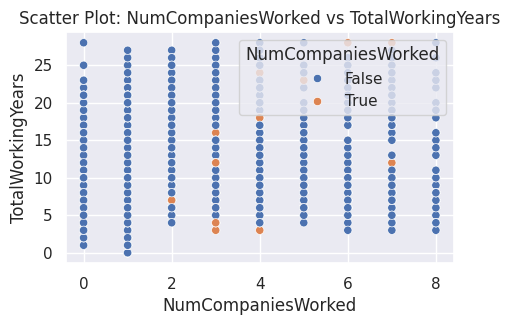

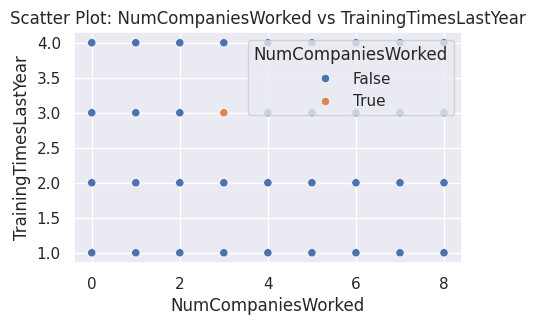

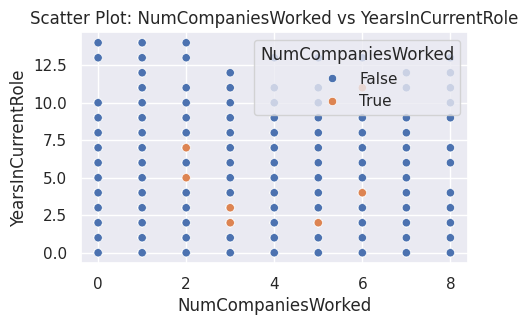

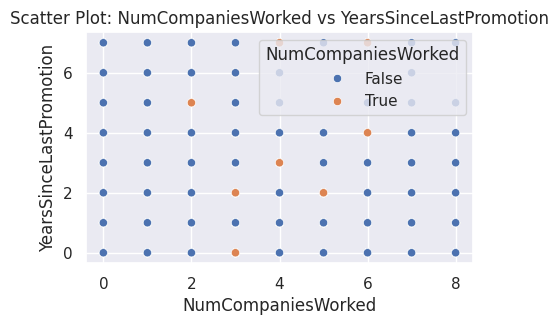

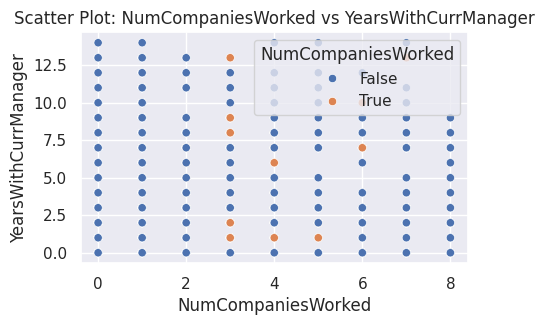

...

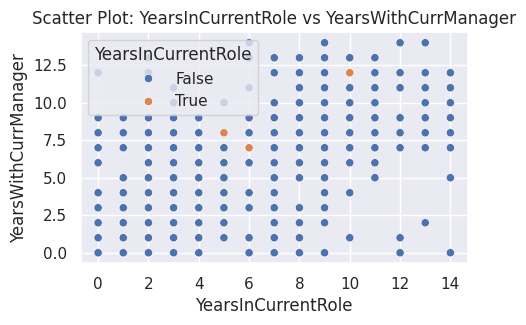

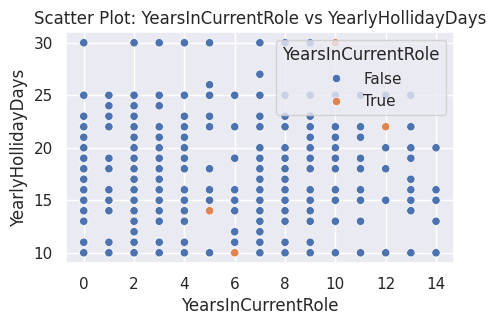

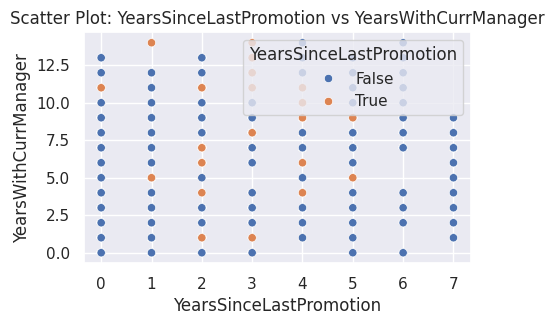

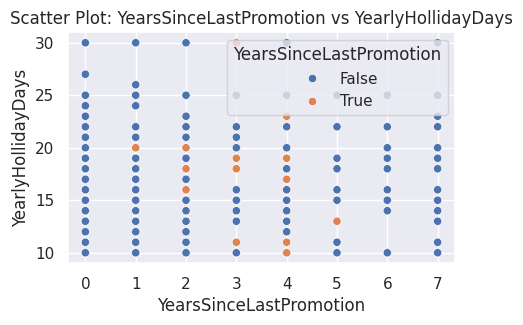

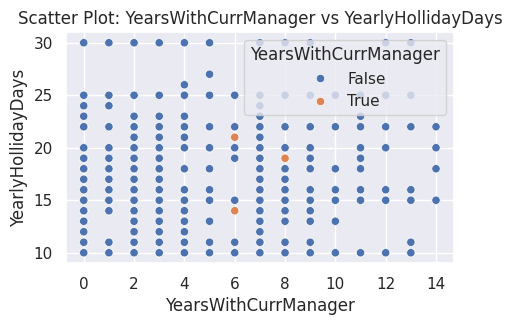

In [ ]:
import seaborn as sns
import itertools

#columns_to_impute = ['NumCompaniesWorked', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearlyHollidayDays']

combinations = list(itertools.combinations(columns_to_impute, 2))

# Create scatter plots for each combination
for combination in combinations:
    plt.figure(figsize=(5, 3))
    sns.scatterplot(x=combination[0], y=combination[1], data=df2, hue=df[combination[0]].isna())
    plt.title(f'Scatter Plot: {combination[0]} vs {combination[1]}')
    plt.show()


We can see that the KNN works very well, and the NA observations we filled by the KNN spreads very similarly to the real observations. Therefore, we converted the df columns into the new columns after the imputation using the KNN algorithm.

In [ ]:
df[columns_to_impute] = df2[columns_to_impute]

df.isna().sum()

Unnamed: 0                  0
Attrition                   0
Age                         0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
YearlyHollidayDays          0
MonthlyInc

####10. Checking the data again with the automatic EDA (SweetViz)

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

sweet_report = sv.analyze(df)

# ציין את הנתיב בו תרצה לשמור
save_path = '/content/drive/MyDrive/sweet_report.html'

# שמור את הדוח
sweet_report.show_html(save_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


                                             |          | [  0%]   00:00 -> (? left)

Report /content/drive/MyDrive/sweet_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



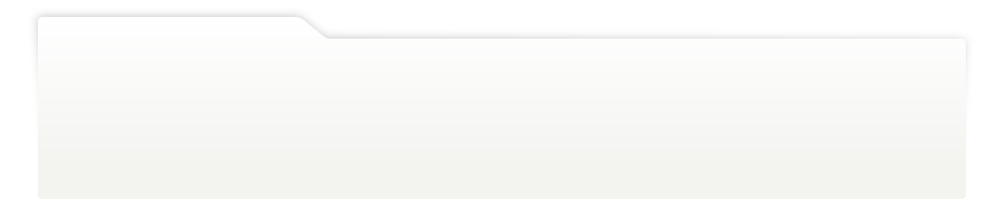
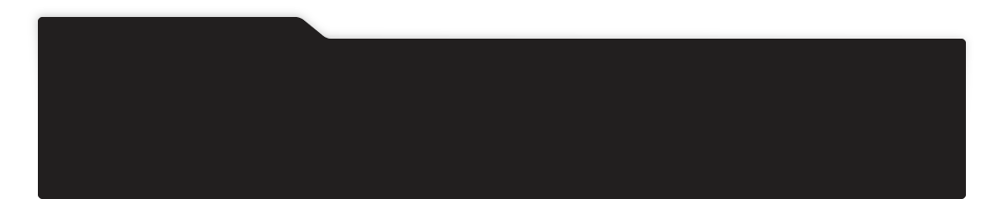
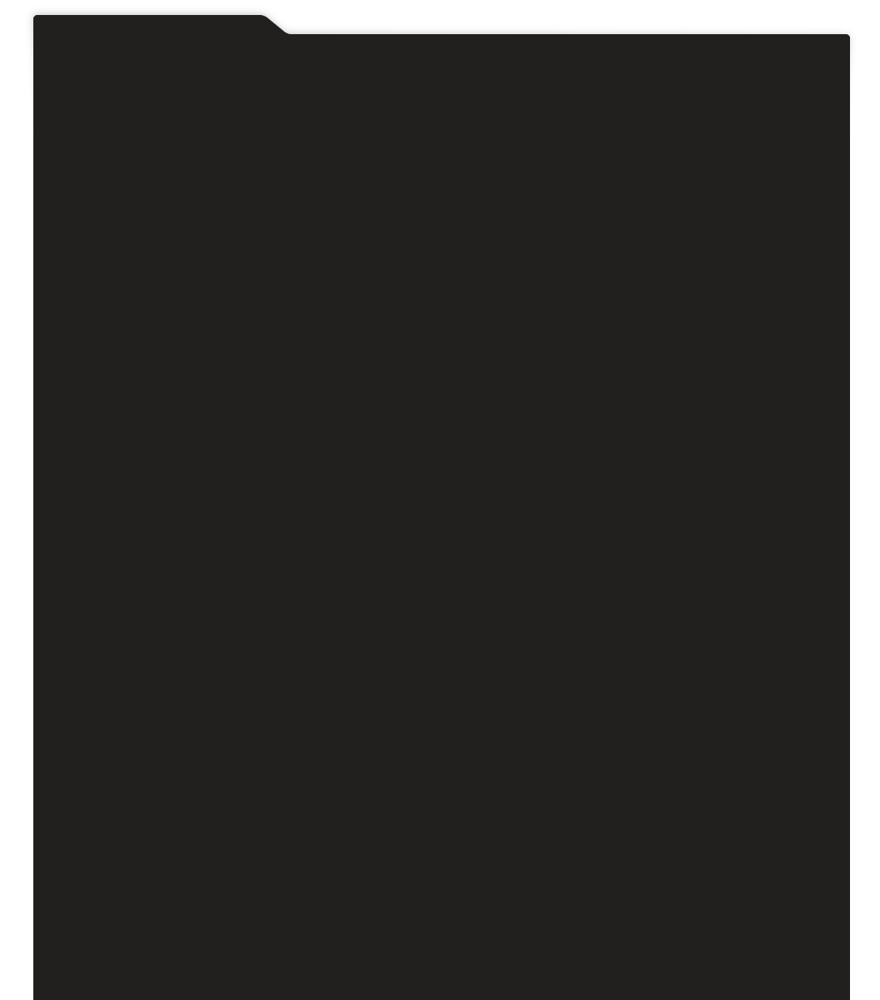
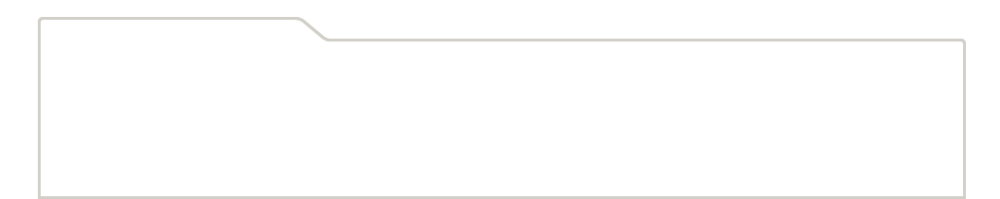
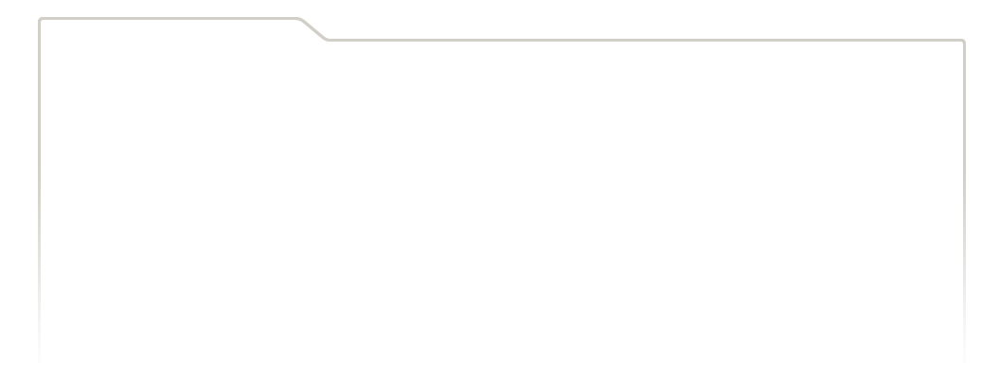
...
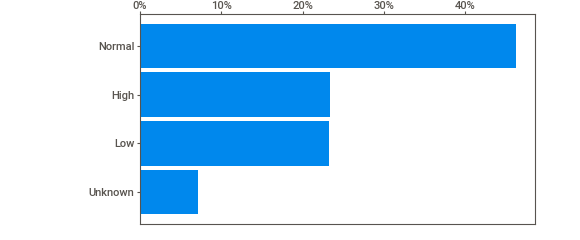
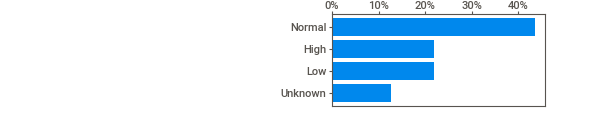
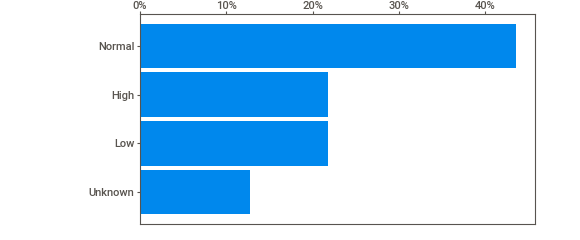
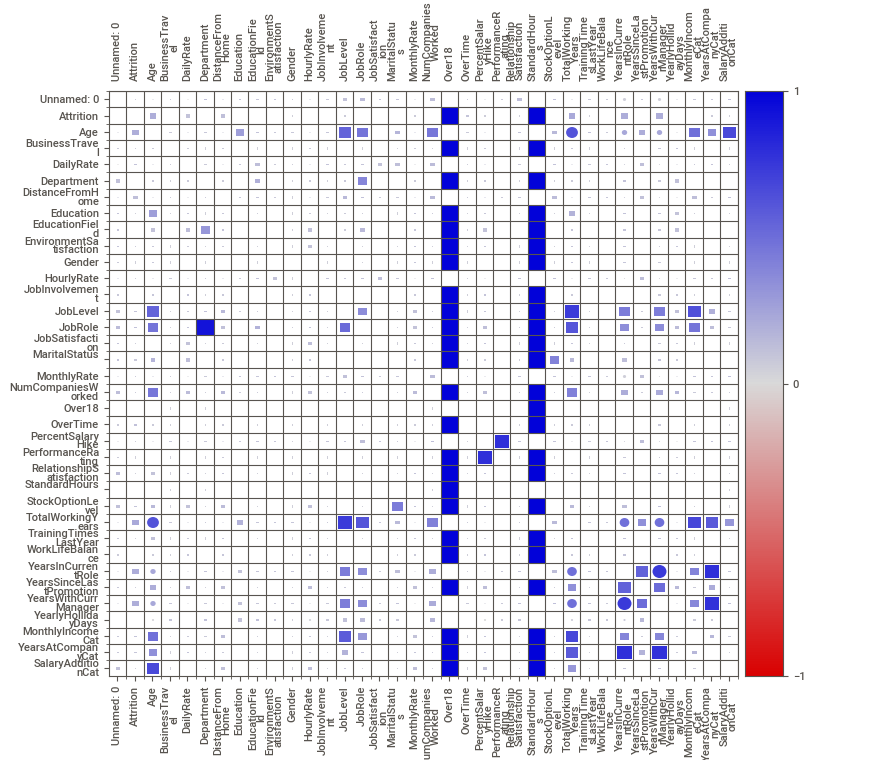
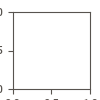

In [ ]:
sweet_report.show_notebook()